# MAGNETIC RESONANCE IMAGING (MRI)

Magnetic resonance imaging (MRI) visualizes anatomy in all three planes: 
#### 1. axial
#### 2. sagittal &
#### 3. coronal 

![](https://case.edu/med/neurology/NR/mri%20slices%20new.jpg "axial, sagittal and coronal plane")

# MRI IMAGING SEQUENCES
There are different types of MRI sequences. The most common are the 
#### 1. T1-weighted (T1w)
#### 2. T2-weighted (T2w)
#### 3. Fluid Attenuated Inversion Recovery (FLAIR)

These sequences vary from each other in their TE (Time to Echo) and TR (Repetition Time) e.g. T1-weighted images are produced by using short TE and TR times while T2-weighted images are produced by using longer TE and TR times. 
T1-weighted imaging can also be performed while infusing Gadolinium (Gad). And that is the 4th type of sequence in this dataset:
#### 4. T1-weighted Gadolinium Post Contrast (T1wCE/T1Gd)

# Comparison of Different Sequences

![](https://media.springernature.com/lw685/springer-static/image/art%3A10.1007%2Fs10278-019-00282-4/MediaObjects/10278_2019_282_Fig1_HTML.png)

**In a T1 weighted sequence:**
* fluid (CSF): black/dark - low signal intensity
* fat: white/light - high signal intensity
* grey matter: grey
* white matter: white-ish

**In a T2 weighted sequence:**
* fluid (CSF): white/bright
* fat: white/light
* grey matter: grey
* white matter: black/dark

FLAIR images appear similar to T1 (CSF is dark). The best way to tell the two apart is to look at the grey-white matter. T1 sequences will have grey matter being darker than white matter.

T1wGd images has bright signals in the blood vessels due to the Gadolinium.

In [1]:
import glob
import pandas as pd
pd.set_option('display.max_colwidth', -1)  
import numpy as np
from tqdm import tqdm

import matplotlib.pyplot as plt
import matplotlib
matplotlib.rcParams['animation.html'] = 'jshtml'
import seaborn as sns

import tensorflow as tf
import tensorflow.keras as keras

import pydicom

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  This is separate from the ipykernel package so we can avoid doing imports until


<AxesSubplot:xlabel='MGMT_value', ylabel='count'>

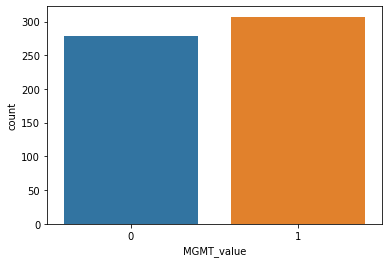

In [2]:
root_dir = '../input/rsna-miccai-brain-tumor-radiogenomic-classification/'

df = pd.read_csv(root_dir+'train_labels.csv')

sns.countplot(data=df, x='MGMT_value')

# What is the 'MGMT_value'?

O[6]-methylguanine-DNA methyltransferase (MGMT) is a protein in cells, including tumour cells, that repairs damage to the cell’s DNA. For example, the damage caused by chemotherapy drugs to tumour cells. The more MGMT protein that the tumour produces, the less effective the chemotherapy drug is expected to be, as the protein will repair the damage to the tumour. Thus, determination of MGMT promoter methylation status in newly diagnosed GBM can influence treatment decision making.

In this dataset the MGMT promoter methylation status data is defined as a binary label (0: unmethylated, 1: methylated)



In [3]:
# Add the full paths for each id for different types of sequences to the csv 
def full_ids(data):
    zeros = 5 - len(str(data))
    if zeros > 0:
        prefix = ''.join(['0' for i in range(zeros)])
    
    return prefix+str(data)
        

df['BraTS21ID_full'] = df['BraTS21ID'].apply(full_ids)

# Add all the paths to the df for easy access
df['flair'] = df['BraTS21ID_full'].apply(lambda file_id : root_dir+'train/'+file_id+'/FLAIR/')
df['t1w'] = df['BraTS21ID_full'].apply(lambda file_id : root_dir+'train/'+file_id+'/T1w/')
df['t1wce'] = df['BraTS21ID_full'].apply(lambda file_id : root_dir+'train/'+file_id+'/T1wCE/')
df['t2w'] = df['BraTS21ID_full'].apply(lambda file_id : root_dir+'train/'+file_id+'/T2w/')
df

,BraTS21ID,MGMT_value,BraTS21ID_full,flair,t1w,t1wce,t2w
0,0,1,00000,../input/rsna-miccai-brain-tumor-radiogenomic-classification/train/00000/FLAIR/,../input/rsna-miccai-brain-tumor-radiogenomic-classification/train/00000/T1w/,../input/rsna-miccai-brain-tumor-radiogenomic-classification/train/00000/T1wCE/,../input/rsna-miccai-brain-tumor-radiogenomic-classification/train/00000/T2w/
1,2,1,00002,../input/rsna-miccai-brain-tumor-radiogenomic-classification/train/00002/FLAIR/,../input/rsna-miccai-brain-tumor-radiogenomic-classification/train/00002/T1w/,../input/rsna-miccai-brain-tumor-radiogenomic-classification/train/00002/T1wCE/,../input/rsna-miccai-brain-tumor-radiogenomic-classification/train/00002/T2w/
2,3,0,00003,../input/rsna-miccai-brain-tumor-radiogenomic-classification/train/00003/FLAIR/,../input/rsna-miccai-brain-tumor-radiogenomic-classification/train/00003/T1w/,../input/rsna-miccai-brain-tumor-radiogenomic-classification/train/00003/T1wCE/,../input/rsna-miccai-brain-tumor-radiogenomic-classification/train/00003/T2w/
3,5,1,00005,../input/rsna-miccai-brain-tumor-radiogenomic-classification/train/00005/FLAIR/,../input/rsna-miccai-brain-tumor-radiogenomic-classification/train/00005/T1w/,../input/rsna-miccai-brain-tumor-radiogenomic-classification/train/00005/T1wCE/,../input/rsna-miccai-brain-tumor-radiogenomic-classification/train/00005/T2w/
4,6,1,00006,../input/rsna-miccai-brain-tumor-radiogenomic-classification/train/00006/FLAIR/,../input/rsna-miccai-brain-tumor-radiogenomic-classification/train/00006/T1w/,../input/rsna-miccai-brain-tumor-radiogenomic-classification/train/00006/T1wCE/,../input/rsna-miccai-brain-tumor-radiogenomic-classification/train/00006/T2w/
...,...,...,...,...,...,...,...
580,1005,1,01005,../input/rsna-miccai-brain-tumor-radiogenomic-classification/train/01005/FLAIR/,../input/rsna-miccai-brain-tumor-radiogenomic-classification/train/01005/T1w/,../input/rsna-miccai-brain-tumor-radiogenomic-classification/train/01005/T1wCE/,../input/rsna-miccai-brain-tumor-radiogenomic-classification/train/01005/T2w/
581,1007,1,01007,../input/rsna-miccai-brain-tumor-radiogenomic-classification/train/01007/FLAIR/,../input/rsna-miccai-brain-tumor-radiogenomic-classification/train/01007/T1w/,../input/rsna-miccai-brain-tumor-radiogenomic-classification/train/01007/T1wCE/,../input/rsna-miccai-brain-tumor-radiogenomic-classification/train/01007/T2w/
582,1008,1,01008,../input/rsna-miccai-brain-tumor-radiogenomic-classification/train/01008/FLAIR/,../input/rsna-miccai-brain-tumor-radiogenomic-classification/train/01008/T1w/,../input/rsna-miccai-brain-tumor-radiogenomic-classification/train/01008/T1wCE/,../input/rsna-miccai-brain-tumor-radiogenomic-classification/train/01008/T2w/
583,1009,0,01009,../input/rsna-miccai-brain-tumor-radiogenomic-classification/train/01009/FLAIR/,../input/rsna-miccai-brain-tumor-radiogenomic-classification/train/01009/T1w/,../input/rsna-miccai-brain-tumor-radiogenomic-classification/train/01009/T1wCE/,../input/rsna-miccai-brain-tumor-radiogenomic-classification/train/01009/T2w/


# DICOM
DICOM is the international standard to communicate and manage medical images and data. Its mission is to ensure the interoperability of systems used to produce, store, share, display, send, query, process, retrieve and print medical images, as well as to manage related workflows. 

DICOM holds all MRI data such as: sequence type, MR acquisition type, patient orientation etc. along with the main MRI image.

In [4]:
data = pydicom.dcmread('../input/rsna-miccai-brain-tumor-radiogenomic-classification/train/00000/T1w/Image-24.dcm')
data

Dataset.file_meta -------------------------------
(0002, 0010) Transfer Syntax UID                 UI: Implicit VR Little Endian
-------------------------------------------------
(0008, 0005) Specific Character Set              CS: 'ISO_IR 100'
(0008, 0008) Image Type                          CS: ['DERIVED', 'SECONDARY']
(0008, 0016) SOP Class UID                       UI: MR Image Storage
(0008, 0018) SOP Instance UID                    UI: 1.2.826.0.1.3680043.8.498.42955106407039211039170882102206590655
(0008, 0050) Accession Number                    SH: '00000'
(0008, 0060) Modality                            CS: 'MR'
(0008, 103e) Series Description                  LO: 'T1w'
(0010, 0010) Patient's Name                      PN: '00000'
(0010, 0020) Patient ID                          LO: '00000'
(0018, 0023) MR Acquisition Type                 CS: '2D'
(0018, 0050) Slice Thickness                     DS: "5.0"
(0018, 0081) Echo Time                           DS: None
(0018, 0083) N

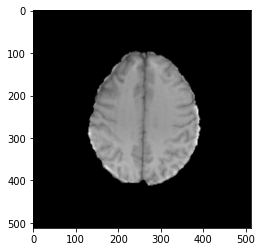

In [5]:
def get_image(data):
    '''
    Returns the image data as a numpy array.
    '''  
    if np.max(data.pixel_array)==0:
        img = data.pixel_array
    else:
        img = data.pixel_array/np.max(data.pixel_array)
        img = (img * 255).astype(np.uint8)
        
    return img

data = pydicom.dcmread('../input/rsna-miccai-brain-tumor-radiogenomic-classification/train/00000/T1w/Image-24.dcm')
img = get_image(data)
plt.imshow(img, cmap='gray')

# Display Sequence of MRIs as Animation
Each subfolder within individual case corresponds to a MRI Imaging Sequence. We use Matplotlib here to display the sequence of images as animation. This animation can also be saved in video format.

In [6]:
def sorted_image_dirs(path: str):
    '''
    Sorts the list of image directories by image number in a path
    '''
    dirs = glob.glob(path+'*')
    dirs.sort(key=lambda x: int(x.split('/')[-1].split('-')[-1].split('.')[0]))
    
    return dirs


def get_all_images(path: str):
    '''
    Returns a list of (non blank) images from a given path (of shape [non_blank_image_count, 512, 512])
    '''
    image_dirs = sorted_image_dirs(path)
    images = []
    
    for directory in image_dirs:
        data = pydicom.dcmread(directory)
        img = get_image(data)
        
        # Exclude the blank images
        if np.max(img)!=0:
            images.append(img)
        else:
            pass
    
    return images
    
def show_animation(images: list):
    '''
    Displays an animation from the list of images.
    
    set: matplotlib.rcParams['animation.html'] = 'jshtml'
    
    '''
    fig = plt.figure(figsize=(6, 6))
    plt.axis('off')
    im = plt.imshow(images[0], cmap='gray')
    
    def animate_func(i):
        im.set_array(images[i])
        return [im]
    
    return matplotlib.animation.FuncAnimation(fig, animate_func, frames = len(images), interval = 20)

## Show FLAIR Sequence of a Patient as Images

No of images: 74
MGMT:  0


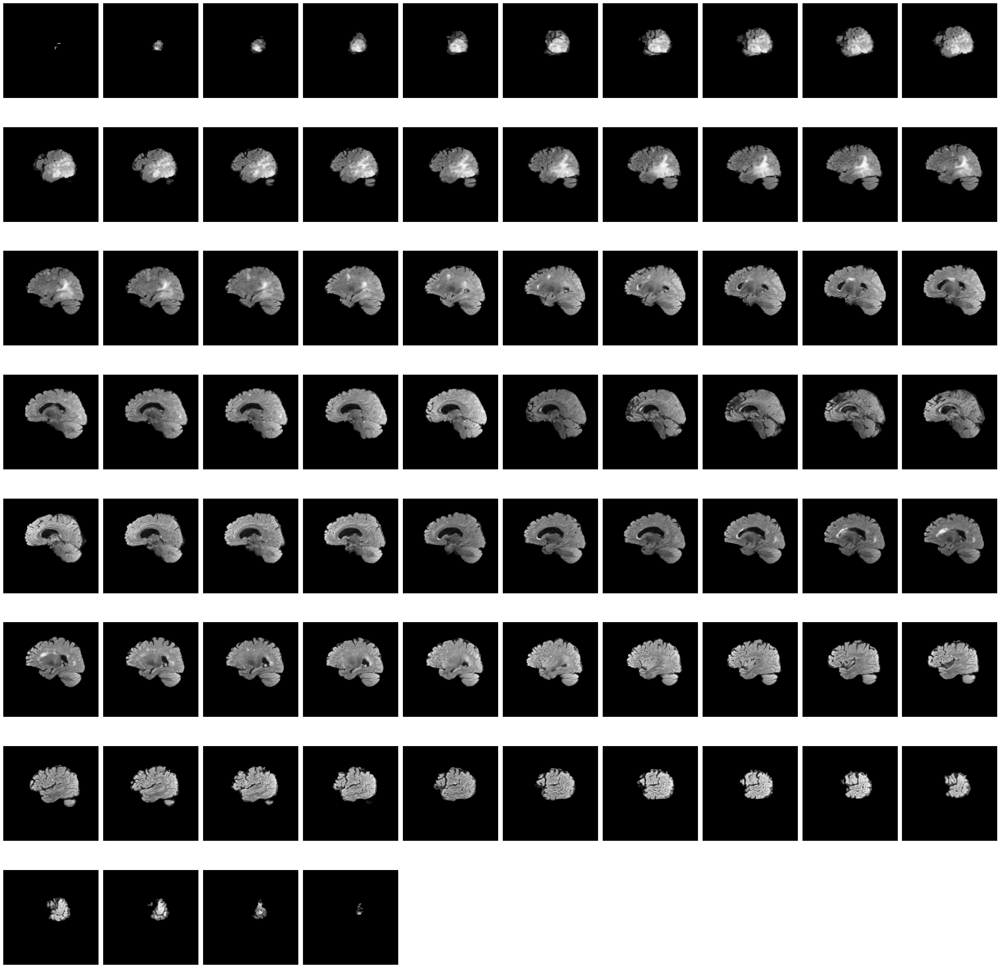

In [7]:
# A random patient - patient 10
patient = 10

flair_images = get_all_images(df['flair'][patient])
print('No of images:', len(flair_images))
print('MGMT: ', df['MGMT_value'][patient])

fig = plt.figure(figsize=(30,30))

c = 1
for image in flair_images:
    ax = fig.add_subplot(len(flair_images)//10+1, 10, c)
    ax.imshow(image, cmap='gray')
    c+=1
    
    plt.axis('off')
    
fig.tight_layout()

## Show Flair Sequence as Animation

No of images: 74


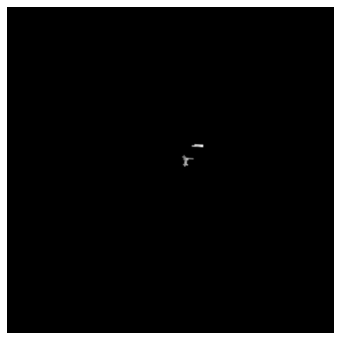

In [8]:
print('No of images:', len(flair_images))

flair_animation = show_animation(flair_images)
flair_animation
# flair_animation.save('./a.mp4')

## Show T1w Sequence as Animation

No of images: 28


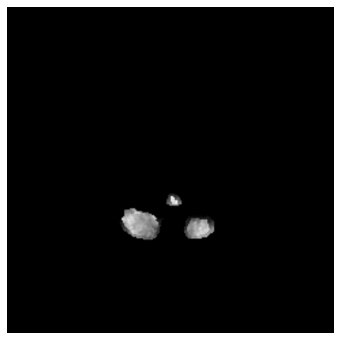

In [9]:
t1w_images = get_all_images(df['t1w'][patient])
    
print('No of images:', len(t1w_images))
show_animation(t1w_images)

# MRI Plane
After reading a dicom file we can get all the information we need like patient orientation, pixel data (Each of the image is a 512x512 array) etc.
As mentioned at the begining of this notebook, MRI can be visualized in 3 different planes - Axial(Transverse), Coronal, Sagittal. The plane of an MR image relative to the patient's body can be calculated using the DICOM Image Orientation Patient tag. 

![](https://my-ms.org/images/mri_planes_gnu.jpg)

In [10]:
def get_image_plane(data):
    '''
    Returns the MRI's plane from the dicom data.
    
    '''
    x1,y1,_,x2,y2,_ = [round(j) for j in data.ImageOrientationPatient]
    cords = [x1,y1,x2,y2]

    if cords == [1,0,0,0]:
        return 'coronal'
    if cords == [1,0,0,1]:
        return 'axial'
    if cords == [0,1,0,0]:
        return 'sagittal'

# Plot of Some Random MRIs with Their Respective Sequences, Planes & MGMT_values
As each of the sequence contains multiple images, we display the middle image of the sequence.

In [11]:
def get_middle_image(path: str, plane=False):
    '''
    Returns the middle image from the path
    
    if plane=True returns the plane
    '''
    image_dirs = sorted_image_dirs(path)

    dicom = pydicom.dcmread(image_dirs[len(image_dirs)//2])
    img = get_image(dicom)
    plane = get_image_plane(dicom)
    
    if plane:
        return img, plane
    else:
        return img

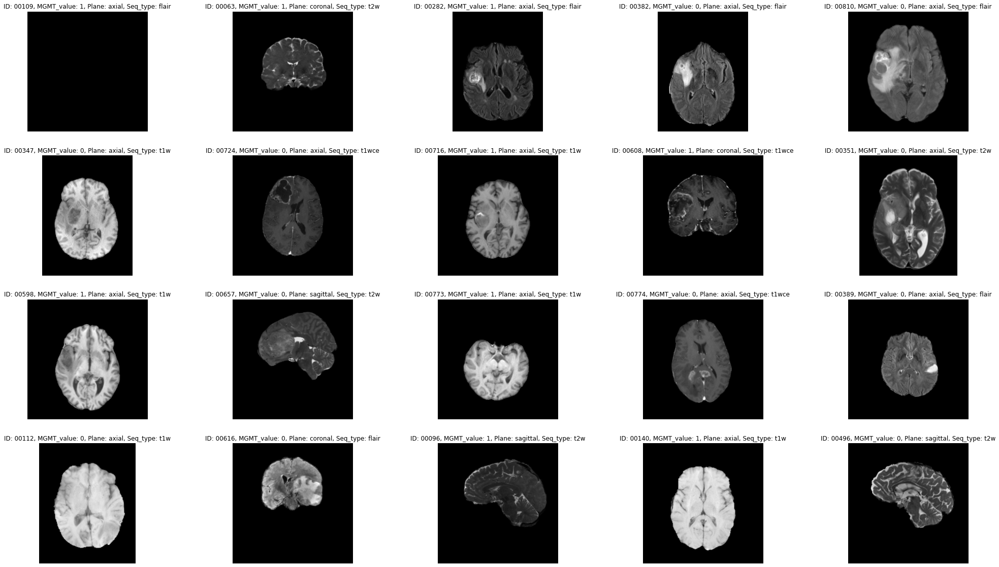

In [12]:
fig = plt.figure(figsize=(35,20))

seq_types = ['flair', 't1w', 't1wce', 't2w']

for i in range(20):
    
    patient = np.random.randint(low=0, high=len(df))
    seq_type = np.random.choice(seq_types)

    # path for the randomly selected image and sequence type
    seq_path = df[seq_type][patient]

    # Get the middle image and plane from the path
    img, plane = get_middle_image(seq_path, plane=True)
    
    patient_id, mgmt = df['BraTS21ID_full'][patient], df['MGMT_value'][patient]
    
    ax = fig.add_subplot(4,5,i+1)
    ax.imshow(img, cmap='gray')
    plt.title(f'ID: {patient_id}, MGMT_value: {mgmt}, Plane: {plane}, Seq_type: {seq_type}')
    plt.axis('off')

# The Planes of 4 type of Sequences for the Same Patient are Not the Same!

After plotting one image (the middle image) from each sequence for the first patient (ID 00000) we can see that, not all the axis are the same. Different sequences planes for one patient can be different.

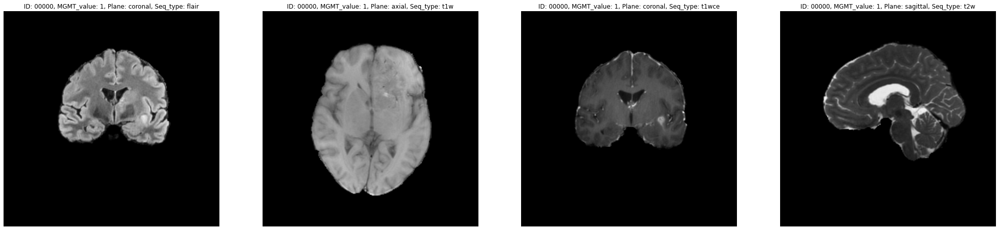

In [13]:
fig = plt.figure(figsize=(35,20))

seq_types = ['flair', 't1w', 't1wce', 't2w']

patient = 0  # The first patient

for i in range(4):
    
    seq_type = seq_types[i]
    seq_path = df[seq_type][patient]

    # Get the middle image and plane from the path
    img, plane = get_middle_image(seq_path, plane=True)
    
    patient_id, mgmt= df['BraTS21ID_full'][patient], df['MGMT_value'][patient]
    
    ax = fig.add_subplot(1,4,i+1)
    ax.imshow(img, cmap='gray')
    plt.title(f'ID: {patient_id}, MGMT_value: {mgmt}, Plane: {plane}, Seq_type: {seq_type}')
    plt.axis('off')

## Add the plane data for each sequence to the exisitng dataframe 

In [14]:
seq_types = ['flair', 't1w', 't1wce', 't2w']

seq_axes = {'flair':[], 't1w':[], 't1wce':[], 't2w':[]}

for index in tqdm(range(len(df))):
    
    for seq in seq_types:
        
        seq_path = df[seq][index]

        # Get the middle image from the path
        img, plane = get_middle_image(seq_path, plane=True)
    
        seq_axes[seq].append(plane)
        
# Add the axes to the dataframe
df['flair_axis'] = seq_axes['flair']
df['t1w_axis'] = seq_axes['t1w']
df['t1wce_axis'] = seq_axes['t1wce']
df['t2w_axis'] = seq_axes['t2w']

# Print the axes with the respective patient ID
df[['BraTS21ID_full', 'flair_axis', 't1w_axis', 't1wce_axis', 't2w_axis']]

100%|██████████| 585/585 [02:20<00:00,  4.16it/s]


,BraTS21ID_full,flair_axis,t1w_axis,t1wce_axis,t2w_axis
0,00000,coronal,axial,coronal,sagittal
1,00002,sagittal,axial,coronal,sagittal
2,00003,sagittal,axial,coronal,sagittal
3,00005,coronal,axial,coronal,sagittal
4,00006,axial,axial,coronal,sagittal
...,...,...,...,...,...
580,01005,axial,axial,axial,axial
581,01007,axial,axial,axial,axial
582,01008,axial,axial,axial,axial
583,01009,axial,axial,axial,axial


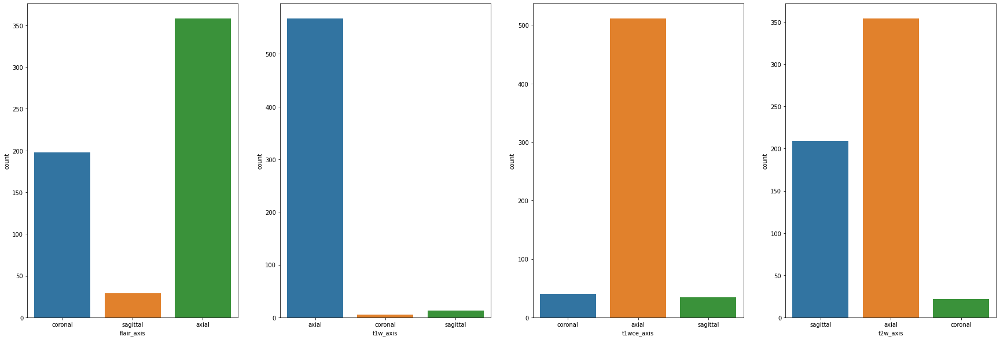

In [15]:
fig, ax = plt.subplots(1,4, figsize=(30,10))

sns.countplot(x='flair_axis', data=df, ax=ax[0])
sns.countplot(x='t1w_axis', data=df, ax=ax[1])
sns.countplot(x='t1wce_axis', data=df, ax=ax[2])
sns.countplot(x='t2w_axis', data=df, ax=ax[3])

plt.show()

In [16]:
!pip install Keras-Applications==1.0.8 -q
!pip install /kaggle/input/keras-3d-model-and-3d-augmentation/efficientnet_3D-1.0.2-py3-none-any.whl -q
!pip install /kaggle/input/keras-3d-model-and-3d-augmentation/classification_models_3D-1.0.3-py3-none-any.whl -q
!pip install /kaggle/input/keras-3d-model-and-3d-augmentation/volumentations_3D-1.0.3-py3-none-any.whl -q
!pip install /kaggle/input/keras-3d-model-and-3d-augmentation/segmentation_models_3D-1.0.3-py3-none-any.whl -q

In [17]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
import os, glob, random, cv2, glob, pydicom, warnings
from sklearn.model_selection import StratifiedKFold

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.filterwarnings('ignore')

# ML pack
import tensorflow as tf; print(tf.__version__)
from tensorflow import keras

# If memory growth is enabled for a PhysicalDevice, the runtime - 
# initialization will not allocate all memory on the device.
physical_devices = tf.config.list_physical_devices('GPU')
try: 
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
    assert tf.config.experimental.get_memory_growth(physical_devices[0])
except:
    # Invalid device or cannot modify virtual devices once initialized.
    pass 
# Params 
AUTO = tf.data.AUTOTUNE

# For reproducible results    
def seed_all(s):
    random.seed(s)
    np.random.seed(s)
    tf.random.set_seed(s)
    os.environ['TF_CUDNN_DETERMINISTIC'] = '1'
    os.environ['PYTHONHASHSEED'] = str(s) 

2.4.1


In [18]:
# Seed all
global_seed = 101 
seed_all(global_seed)

# Training Fold
total_fold = 5
fold = 0  

# After notebook version 8, modeling_in = '2D' is not supported. 
modeling_in = '3D' # Support:'2D' or '3D' modeling,  

# Augmentation library that can be used for 3D model training.
# We can use `keras` preprocessing image augmentation library,
# Or, we can use pure 'tf' image operations for augmentation, 
# Or, we can use 'volumentations' 3rd party library build on albumentation. 
aug_lib = 'keras'  # Support, arg: 'tf', 'keras', 'volumentations'

# In this competition, we have four modalities for each study
# If you want to train slngle modality training, you need to change few code 
# in the data loader. 
input_modality = ["FLAIR", "T1w", "T1wCE", "T2w"] 

# Sample input shape: 
# (batch_size, input_height, input_width, input_depth, input_channel) 
batch_size    = 1   # Number of the batch size
accum_step    = 3   # Gradient accumulation steps
input_height  = 120
input_width   = 120
input_channel = len(input_modality)  # Total number of channel, e.g. 4 
input_depth   = 30 # Total number of slices from each modality, e.g. 3

In [19]:
root = '../input/rsna-miccai-brain-tumor-radiogenomic-classification/'

df = pd.read_csv(f'{root}train_labels.csv') 
train_sample_path = f'{root}train'

print(df.shape)
print(df.MGMT_value.value_counts())

print('\nno. of the image {} and no. of the unique id {}'.\
      format(len(os.listdir(train_sample_path)), df.BraTS21ID.nunique()))

print('\ntop 5:')
df.head()

(585, 2)
1    307
0    278
Name: MGMT_value, dtype: int64

no. of the image 585 and no. of the unique id 585

top 5:


,BraTS21ID,MGMT_value
0,0,1
1,2,1
2,3,0
3,5,1
4,6,1


In [20]:
skf = StratifiedKFold(n_splits=total_fold, shuffle=True, random_state=global_seed)

for index, (train_index, val_index) in enumerate(skf.split(X=df.index, 
                                                           y=df.MGMT_value)):
    df.loc[val_index, 'fold'] = index
    
print('Ground Truth Distribution Fold-Wise..')
print(df.groupby(['fold', df.MGMT_value]).size())

Ground Truth Distribution Fold-Wise..
fold  MGMT_value
0.0   0             55
      1             62
1.0   0             55
      1             62
2.0   0             56
      1             61
3.0   0             56
      1             61
4.0   0             56
      1             61
dtype: int64


In [21]:
# data loader 
class BrainTumorGenerator(keras.utils.Sequence):
    def __init__(self, dicom_path, data, is_train=True):
        self.is_train = is_train # to control training/validation/inference part 
        self.data = data
        self.dicom_path = dicom_path
        self.label = self.data['MGMT_value']
  
    def __len__(self):
        return len(self.data['BraTS21ID'])
    
    def __getitem__(self, index):
        patient_ids = f"{self.dicom_path}/{str(self.data['BraTS21ID'][index]).zfill(5)}/"
   
        # For 2D modeling 
        # NOTE: For 2D model training, see notebook version 8 or less. 
        channel = []
    
        # for 3D modeling 
        flair = []
        t1w   = []
        t1wce = []
        t2w   = [] 
        
        # Iterating over each modality
        for m, t in enumerate(input_modality):
            t_paths = sorted(
                glob.glob(os.path.join(patient_ids, t, "*")), 
                key=lambda x: int(x[:-4].split("-")[-1]),
            )
            
            # Pick input_depth times slices -
            # - from middle range possible 
            strt_idx = (len(t_paths) // 2) - (input_depth // 2)
            end_idx = (len(t_paths) // 2) + (input_depth // 2)
            # slicing extracting elements with 1 intervals 
            picked_slices = t_paths[strt_idx:end_idx:1]
            
            # Iterating over the picked slices and do some basic processing, 
            # such as removing black borders
            # and lastly, bind them all in the end.
            for i in picked_slices:
                # Reading pixel file from dicom file 
                image = self.read_dicom_xray(i)
                
                # It's possible that among picked_slices, there can be some black image, 
                # which is not wanted, so we iterate back to dicom file to get - 
                # - any non-black image otherwise move on with black image 
                j = 0
                while True:
                    # if it's a black image, try to pick any random slice of non-black  
                    # otherwise move on with black image. 
                    if image.mean() == 0:
                        # do something 
                        image = self.read_dicom_xray(random.choice(t_paths)) 
                        j += 1
                        if j == 100:
                            break
                    else:
                        break
                        
                # Now, we remove black areas; remove black borders from brain image 
                rows = np.where(np.max(image, 0) > 0)[0]
                cols = np.where(np.max(image, 1) > 0)[0]
                if rows.size:
                    image = image[cols[0]: cols[-1] + 1, rows[0]: rows[-1] + 1]
                else:
                    image = image[:1, :1]
           
                # In 3D modeling, we now add frames / slices of individual modalities 
                if modeling_in == '3D':
                    if m == 0:
                        # Adding flair 
                        flair.append(cv2.resize(image, (input_height, input_width)))
                    elif m == 1:
                        # Adding t1w
                        t1w.append(cv2.resize(image, (input_height, input_width)))
                    elif m == 2:
                        # Adding t1wce
                        t1wce.append(cv2.resize(image, (input_height, input_width)))
                    elif m == 3:
                        # Adding t2w
                        t2w.append(cv2.resize(image, (input_height, input_width)))
                elif modeling_in == '2D':
                    # Adding all frames at a time 
                    channel.append(cv2.resize(image, (input_height, input_width)))
                    

        if modeling_in == '3D':
            # [ATTENTION!!!]
            # input_shape: (None, h, w, depth, channel)
            # It's possible that with current data loader set up, 
            # All modalities MAY NOT HAVE SAME number of slices.
            # In that case, we adopt some workaround.
            # Right now, we re-append the existing slice with small color variation.
            # Just to avoid this issue.
            
            # for flair 
            while True:
                if len(flair) < input_depth and flair:
                    flair.append(cv2.convertScaleAbs(random.choice(flair), alpha=1.2, beta=0))
                else:
                    break
            
            # for t1w
            while True:
                if len(t1w) < input_depth and t1w:
                    t1w.append(cv2.convertScaleAbs(random.choice(t1w), alpha=1.1, beta=0))
                else:
                    break

            # for t1wce
            while True:
                if len(t1wce) < input_depth and t1wce:
                    t1wce.append(cv2.convertScaleAbs(random.choice(t1wce), alpha=1.2, beta=0))
                else:
                    break

            # for t2w
            while True:
                if len(t2w) < input_depth and t2w:
                    t2w.append(cv2.convertScaleAbs(random.choice(t2w), alpha=1.1, beta=0))
                else:
                    break
            
            return np.array((flair, t1w, t1wce, t2w),
                            dtype="object").T, self.label.iloc[index,]
            
    
        elif modeling_in == '2D':
            # (None, h, w, channel == depth)
            return np.array(channel).T, self.label.iloc[index,]
        
    # Function to read dicom file 
    def read_dicom_xray(self, path):
        data = pydicom.read_file(path).pixel_array
        if data.mean() == 0:
            # If all black, return data and find non-black if possible.
            return data 
        data = data - np.min(data)
        data = data / np.max(data)
        data = (data * 255).astype(np.uint8)
        return data

In [22]:
def fold_generator(fold):
    train_labels = df[df.fold != fold].reset_index(drop=True)
    val_labels   = df[df.fold == fold].reset_index(drop=True)
    return (
        BrainTumorGenerator(train_sample_path, train_labels),
        BrainTumorGenerator(train_sample_path, val_labels)
    )

# Get fold set
train_gen, val_gen = fold_generator(fold)

In [23]:
if modeling_in == '2D':
    train_data = tf.data.Dataset.from_generator(
        lambda: map(tuple, train_gen),
        (tf.float32, tf.float32),
        (
            tf.TensorShape([input_height, input_width, input_depth*input_channel]),
            tf.TensorShape([]),
        ),
    )

    val_data = tf.data.Dataset.from_generator(
        lambda: map(tuple, val_gen),
        (tf.float32, tf.float32),
        (
            tf.TensorShape([input_height, input_width, input_depth*input_channel]),
            tf.TensorShape([]),
        ),
    )
else:
    train_data = tf.data.Dataset.from_generator(
        lambda: map(tuple, train_gen),
        (tf.float32, tf.float32),
        (
            tf.TensorShape([input_height, input_width, input_depth, input_channel]),
            tf.TensorShape([]),
        ),
    )

    val_data = tf.data.Dataset.from_generator(
        lambda: map(tuple, val_gen),
        (tf.float32, tf.float32),
        (
            tf.TensorShape([input_height, input_width, input_depth, input_channel]),
            tf.TensorShape([]),
        ),
    )

# 3D Augmentation
In order to do data augmentation on 3D samples, we will have option to choose keras image preprocessing layers, tf image deterministic modules and volumentations which is based on well-known albumentation package. Note that, same augmentation of all slices from each modality needs to be ensured.

In keras, we've some built-in Image augmentation layers. We can use it in data loading time or we can integrate them inside the model definition to leverage GPU power. For now, we'll be using them on data loading section. We will also implement and use some custom layers for image augmentation. Note that, we need to ensure that, same augmentation must be applied to each slices of a modality, otherwise it'd be probabely meaningless to use them. FYI, keras has a convinient function called TimeDistributed which can be applied in such case.
In tf, we'll be using tf.image.stateless_* modules for deterministic results. So that, we can apply same augmentation on all slices of a modality.

Lastly, in volumentations, originally developed by hawkey and greatly improved by ZFTurbo. Please, appreciate their open-source code if it helps. The same augmentation is handle by itself; less pain.

# Keras 3D Augmentation
From API, we've RandomFlip, RandomRotation, RandomCrop etc layers. Apart from the buil-in layer, we will be building our own image processing layer and use them for image augmentation. For example: RandomInvert, RandomEqualize and RandomCutout.

In [24]:
import tensorflow_addons as tfa
from tensorflow.keras import layers

# Custom Layer 1 
class RandomInvert(layers.Layer):
    def __init__(self, prob=0.5, **kwargs):
        super().__init__(**kwargs)
        self.prob = prob
        
    def call(self, inputs, training=True):
        tf.random.set_seed(global_seed)
        if tf.random.uniform([]) < self.prob:
            return tf.cast(255.0 - inputs, dtype=tf.float32)
        else: 
            return tf.cast(inputs, dtype=tf.float32)
        
    def get_config(self):
        config = {
            'prob': self.prob,
        }
        base_config = super(RandomInvert, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))
    
    def compute_output_shape(self, input_shape):
        return input_shape
    
# Custom Layer 2 
class RandomEqualize(layers.Layer):
    def __init__(self, prob=0.5, **kwargs):
        super().__init__(**kwargs)
        self.prob = prob
        
    def call(self, inputs, training=True):
        tf.random.set_seed(global_seed)
        if tf.random.uniform([]) < self.prob:
            return tf.cast(tfa.image.equalize(inputs), dtype=tf.float32)
        else: 
            return tf.cast(inputs, dtype=tf.float32)
        
    def get_config(self):
        config = {
            'prob': self.prob,
        }
        base_config = super(RandomEqualize, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))
    
    def compute_output_shape(self, input_shape):
        return input_shape
        
# Custom Layer 3
class RandomCutout(layers.Layer):
    def __init__(self, prob=0.5, mask_size=(20, 20), replace=0, **kwargs):
        super().__init__(**kwargs)
        self.prob = prob 
        self.replace = replace
        self.mask_size = mask_size
        
    def call(self, inputs, training=True):
        tf.random.set_seed(global_seed)
        if tf.random.uniform([]) < self.prob:
            inputs = tfa.image.random_cutout(inputs, 
                                             mask_size=self.mask_size, 
                                             constant_values=self.replace)  
            return tf.cast(inputs, dtype=tf.float32)
        else: 
            return tf.cast(inputs, dtype=tf.float32)
        
    def get_config(self):
        config = {
            'prob': self.prob,
            'replace': self.replace,
            'mask_size': self.mask_size
        }
        base_config = super(RandomCutout, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))
    
    def compute_output_shape(self, input_shape):
        return input_shape

In [25]:
set_seed = None
rand_flip = tf.keras.layers.experimental.preprocessing.RandomFlip(mode="horizontal_and_vertical", seed=set_seed)
rand_tran = tf.keras.layers.experimental.preprocessing.RandomTranslation(height_factor=0.1, width_factor=0.2, seed=set_seed)
rand_rote = tf.keras.layers.experimental.preprocessing.RandomRotation(factor=0.01, seed=set_seed)
rand_cntr = tf.keras.layers.experimental.preprocessing.RandomContrast(factor=0.6, seed=set_seed)
rand_crop = tf.keras.layers.experimental.preprocessing.RandomCrop(int(input_height*0.97), int(input_width*0.97), seed=set_seed)
rand_eqlz = RandomEqualize()

def keras_augment(image, label):
    all_modality = tf.reshape(image, [-1, input_height, input_width, input_depth*input_channel])
    
    def apply_augment(x):
        x = rand_eqlz(x)
        x = rand_flip(x)
        x = rand_tran(x)
        x = rand_rote(x)
        x = rand_cntr(x)
        x = rand_crop(x)
        x = layers.experimental.preprocessing.Resizing(input_height, input_width)(x)
        return x 
    
    aug_images = apply_augment(all_modality)
    image = tf.reshape(aug_images, 
                       [-1, input_height, input_width, input_depth, input_channel])
    
    return image, label

In [26]:
if modeling_in == '2D':
    #  keras augmentation
    keras_augment = tf.keras.Sequential(
        [
            RandomFlip("horizontal", dtype=tf.float32),
            RandomRotation(factor=0.01, dtype=tf.float32),
            RandomTranslation(height_factor=0.0, width_factor=0.1, dtype=tf.float32),
            RandomZoom(height_factor=(-0.1, -0.2), width_factor=(-0.1, -0.2)),
            RandomInvert(prob=0.1),
            RandomCutout(prob=0.8, replace=0, 
                         mask_size=(int(input_height * 0.2),
                                    int(input_width * 0.2))),
            RandomEqualize(prob=0.5)
        ],
        name='keras_augment_layers'
    )

## TensorFlow 3D Augmentation

In [27]:
def tf_image_augmentation(image):  
    # splitted based on modalites. we have 4 type of modalities. Input shape (h, w, depth, channel==4)
    if modeling_in == '3D':
        # input shape: image.shape -> (h, w, input_depth, input_channel)
        # in such condition, we split based on the number of channel, which is 4 here. 
        # after that the variable will contains 4 splitted tensor 
        # each of which is in a shape of (h, w, input_depth, 1)
        splitted_modalities = tf.split(tf.cast(image, tf.float32), input_channel, axis=-1) 
    elif modeling_in == '2D':
        # input shape: image.shape -> (h, w, input_depth * input_channel)
        # in such condition, we split based on the number of channel, which is 4 here.
        # after that the variable will contains 4 splitted tensor 
        # each of which is in a shape of (h, w, input_depth)
        splitted_modalities = tf.split(tf.cast(image, tf.float32), input_channel, axis=-1) 
    
    
    # augmented frames for 2d modeling 
    # for 2d modeling we use 1 container to gather all augmented samples from 4 modalites
    # however, same augmentation is ensured for each modality for one study
    augment_img = []
    
    # augmented frames for 3d modeling 
    # for 3d modeling we use 4 container to gather all augmented samples from 4 modalites
    # however, same augmentation is ensured for each modality for one study
    flair_augment_img = []
    t1w_augment_img   = []
    t1wce_augment_img = []
    t2w_augment_img   = []
    
    
    if modeling_in == '3D':
        # remove the last axis.
        # input: (h, w, input_depth, 1) : output: (h, w, input_depth)
        splitted_modalities = [tf.squeeze(i, axis=-1) for i in splitted_modalities] 
    
    # iterate over each modalities, e.g: flair, t1w, t1wce, t2w
    for j, modality in enumerate(splitted_modalities):
        # now splitting each frame from one modality 
        splitted_frames = tf.split(tf.cast(modality, tf.float32), modality.shape[-1], axis=-1)
        
        # iterate over each frame to conduct same augmentation on 
        # each frame 
        for i, img in enumerate(splitted_frames):
            # Given the same seed, they return the same results independent of 
            # how many times they are called.
            # It's very important to get deterministic augmentation results of each modality. 
            tf.random.set_seed(j)
            np.random.seed(j)
            
            # In tf.image.stateless_random_* , the seed is a Tensor of shape (2,) -
            # - whose values are any integers.
            img = tf.image.stateless_random_flip_left_right(img, seed = (j, 2))
            img = tf.image.stateless_random_flip_up_down(img, seed = (j, 2))
            img = tf.image.stateless_random_contrast(img, 0.4, 0.8, seed = (j, 2))
            img = tf.image.stateless_random_brightness(img, 0.3, seed = (j, 2))
            
            # For some operation, it requires channel == 3 
            img = tf.image.stateless_random_saturation(tf.image.grayscale_to_rgb(img), 
                                                       0.9, 1.8, seed = (j, 2))
            img = tf.image.stateless_random_hue(img, 0.4, seed = (j, 2))

            # For some operation we don't need channel == 3, just 1 is enough 
            img = tf.image.rgb_to_grayscale(img)
            img = tf.cast(
                tf.image.stateless_random_jpeg_quality(
                    tf.cast(img, tf.uint8), 
                    min_jpeg_quality=20, max_jpeg_quality=40, seed = (j, 2)
                ), tf.float32)

            # Ensuring same augmentation for each modalities 
            if tf.random.uniform((), seed=j) > 0.7:
                kimg = np.random.choice([1,2,3,4])
                kgma = np.random.choice([0.7, 0.9, 1.2])
                
                img = tf.image.rot90(img, k=kimg) # random rate to any of 90, 180, 270, 360 
                img = tf.image.adjust_gamma(img, gamma=kgma) # adjust the gamma 
                noise = tf.random.normal(shape=tf.shape(img), mean=0.0, stddev=0.2,
                                         dtype=tf.float32, seed=j) 
                img = img + noise # additive gaussian noise to image 

            # The mask_size should be divisible by 2. 
            if tf.random.uniform((), seed=j) > 0.6:
                img = tfa.image.random_cutout(tf.expand_dims(img, 0),
                                              mask_size=(int(input_height * 0.2),
                                                         int(input_width * 0.2)), 
                                              constant_values=0) 
                img = tf.squeeze(img, axis=0)
            
            # Clipping. We'll rescale later. 
            img = tf.clip_by_value(img, 0, 255)
            
            # Gathering all frames 
            if modeling_in == '3D':
                if j == 0: # 1st modality 
                    flair_augment_img.append(img)
                elif j == 1: # 2nd modality 
                    t1w_augment_img.append(img)
                elif j == 2: # 3rd modality 
                    t1wce_augment_img.append(img)
                elif j == 3:  # 4th modality 
                    t2w_augment_img.append(img)
            elif modeling_in == '2D':
                augment_img.append(img)
      
    
    if modeling_in == '3D':
        image = tf.transpose([flair_augment_img, t1w_augment_img, 
                              t1wce_augment_img, t2w_augment_img])
        image = tf.reshape(image, [input_height, input_width, input_depth, input_channel])
    elif modeling_in == '2D':
        image = tf.concat(augment_img, axis=-1)
        image = tf.reshape(image, [input_height, input_width, input_depth*input_channel])
    return image

## Volumentation 3D

In [28]:
from functools import partial
from volumentations import *

def get_augmentation(patch_size):
    return Compose([
        Rotate((-5, 5), (0, 0), (0, 0), p=0.5),
        RandomCropFromBorders(crop_value=0.1, p=0.3),
        ElasticTransform((0, 0.15), interpolation=2, p=0.5),
        Resize(patch_size, interpolation=1, always_apply=True, p=1.0),
        Flip(0, p=0.5),
        Flip(1, p=0.5),
        RandomRotate90((0, 1), p=0.6),
        GaussianNoise(var_limit=(0, 5), p=0.5),
        RandomGamma(gamma_limit=(0.5, 1.5), p=0.7),
    ], p=1.0)

volume3D = get_augmentation((input_height, input_width, input_depth))

def volume3Dfn(image):    
    aug_data = volume3D(**{"image":image})
    return tf.cast(aug_data["image"], tf.float32)

def volumentations_aug(image, label):
    # Wraps a python function and uses it as a TensorFlow op.
    aug_img = tf.numpy_function(func=volume3Dfn, 
                                inp=[image], 
                                Tout=tf.float32)
    aug_img.set_shape((input_height, input_width, input_depth, input_channel))
    return aug_img, label

In [29]:
class TFDataGenerator:
    def __init__(self, 
                 data, 
                 modeling_in, 
                 shuffle, 
                 aug_lib,
                 batch_size, 
                 rescale):
        if modeling_in not in ['2D', '3D']:
            raise ValueError('modeling_in is not set either 2D or 3D')
        self.data        = data             # data files 
        self.modeling_in = modeling_in      # 2D or 3D 
        self.shuffle     = shuffle          # true for training 
        self.aug_lib     = aug_lib          # type of augmentation library 
        self.batch_size  = batch_size       # batch size number 
        self.rescale     = rescale          # normalize or not 
        
    # a convinient function to get 2D data set 
    def get_2D_data(self):
        self.data = self.data.shuffle(buffer_size = self.batch_size * 100) \
                                                        if self.shuffle \
                                                        else self.data
        
        if self.aug_lib == 'tf' and self.shuffle:
            # augmentaiton using tf.image.stateless_random* functions 
            # applicable for multiple channel (channel > 3 )
            # same augmentation would be applied to each modalites: flair, t1w, t1wce, t2w
            # check the tf_image_augmentation code for details 
            self.data = self.data.map(lambda x, y: (tf_image_augmentation(x), y),
                                      num_parallel_calls=AUTO).batch(self.batch_size,
                                                                     drop_remainder=self.shuffle)
        elif self.aug_lib == 'keras' and self.shuffle:
            # augmentaion using keras image preprocessing layers 
            # applicable for multiple channels (channel > 3)
            # [known issue]:  same augmentaion would be applied for all modalites 
            # check the tf_image_augmentation code for details  
            self.data = self.data.batch(self.batch_size, drop_remainder=self.shuffle) 
            self.data = self.data.map(lambda x, y: (keras_augment(x,training=True),
                                                    y), 
                                      num_parallel_calls=AUTO)
        elif not self.shuffle:
            # no shuffle generally assuming no augmentaion too, so not training 
            # for inference and evaluation 
            self.data = self.data.batch(self.batch_size, drop_remainder=self.shuffle) 
            
            
        # rescaling the data for faster convergence 
        if self.rescale:    
            self.data = self.data.map(lambda x, y: (layers.Rescaling(scale=1./255, offset=0.0)(x), y), 
                                      num_parallel_calls=AUTO)
            
        # prefetching the data 
        return self.data.prefetch(-1) 
            
    # a convinient function to get 3D data set 
    def get_3D_data(self):
        # augmentation on 3D data set
        # volumentation is based on albumentation, followed by tf and keras 
        if self.aug_lib == 'volumentations' and self.shuffle:
            self.data = self.data.map(partial(volumentations_aug), num_parallel_calls=AUTO)
            self.data = self.data.batch(batch_size, drop_remainder=self.shuffle)
        elif self.aug_lib == 'tf' and self.shuffle:
            self.data = self.data.map(lambda x, y: (tf_image_augmentation(x), y),num_parallel_calls=AUTO)
            self.data = self.data.batch(self.batch_size,drop_remainder=self.shuffle)
        elif self.aug_lib == 'keras' and self.shuffle:
            self.data = self.data.batch(self.batch_size, drop_remainder=self.shuffle) 
            self.data = self.data.map(lambda x, y: keras_augment(x, y), num_parallel_calls=AUTO)
        else:
            # true for evaluation and inference, no augmentation 
            self.data = self.data.batch(self.batch_size, drop_remainder=self.shuffle)
        
        # rescaling the data for faster convergence 
        if self.rescale:    
            self.data = self.data.map(lambda x, y: (layers.experimental.preprocessing.Rescaling(scale=1./255, offset=0.0)(x), y), 
                                      num_parallel_calls=AUTO)
            
        # prefetching the data 
        return self.data.prefetch(-1) 

## Visualize Train Set with TensorFlow Augmentation

In [30]:
#tf.keras.layers.experimental.preprocessing.Rescaling()
tf_gen = TFDataGenerator(
    train_data,
    modeling_in = modeling_in, 
    shuffle     = True,     
    aug_lib     = 'tf',  
    batch_size  = batch_size,   
    rescale     = True
)  
                   
if modeling_in == '2D':
    train_generator = tf_gen.get_2D_data()
elif modeling_in == '3D':
    train_generator = tf_gen.get_3D_data()

(1, 120, 120, 30, 4) (1,) 0.8941177 1.0


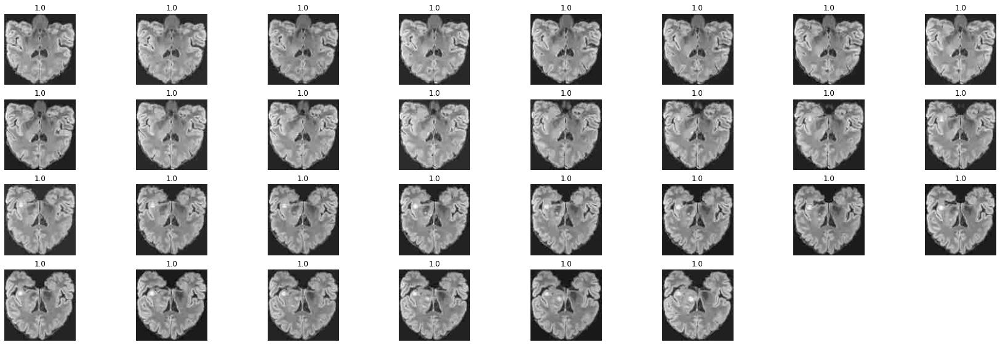

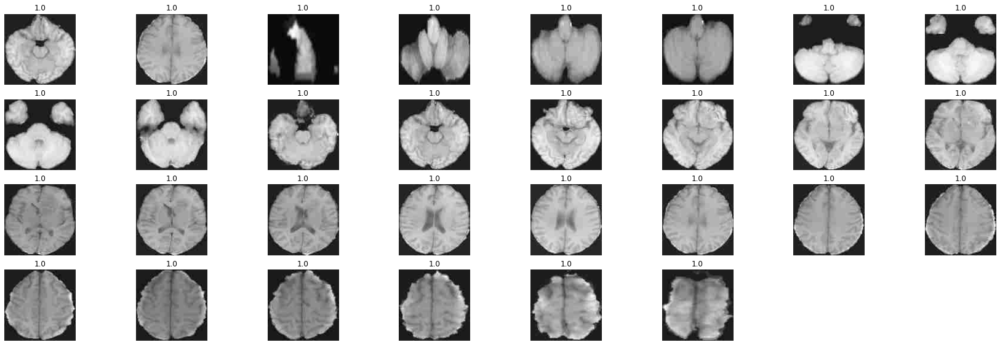

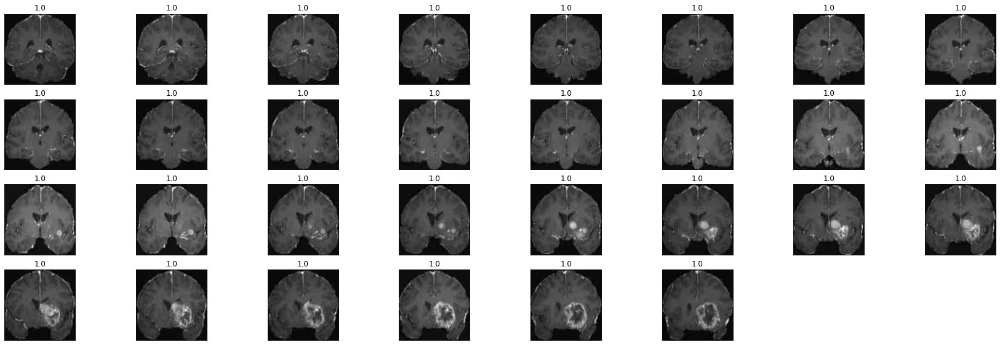

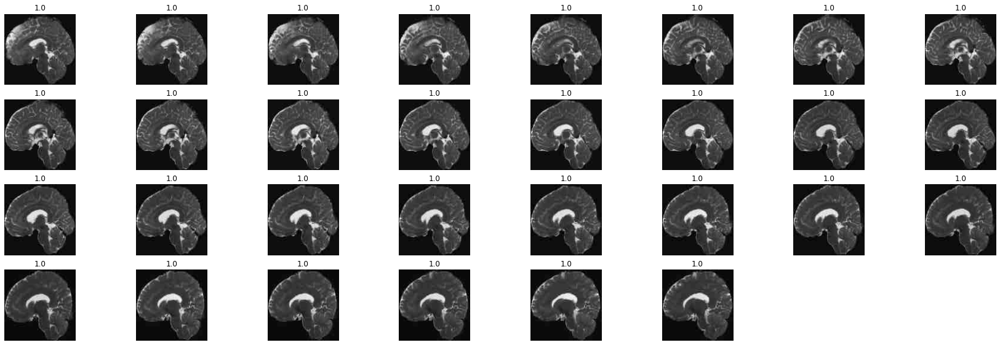

In [31]:
x, y = next(iter(train_generator))
print(x.shape, y.shape, x.numpy().max(), y.numpy().min())  

if modeling_in == '3D':
    for j in range(input_channel):
        plt.figure(figsize=(30, 20))
        for i in range(input_depth):
            plt.subplot(8, 8, i + 1)
            plt.imshow(x[0 ,:, :, i, j], cmap='gray')
            plt.axis("off")
            plt.title(y[0].numpy())
        plt.show()
elif modeling_in == '2D':
    plt.figure(figsize=(30, 20))
    for i in range(input_depth*input_channel):
        plt.subplot(5, 8, i + 1)
        plt.imshow(x[5 ,:, :, i], cmap='gray')
        plt.axis("off")
        plt.title(y[j].numpy())

## Visualize Train Set with Volumentations Augmentation

In [32]:
tf_gen = TFDataGenerator(
    train_data,
    modeling_in = modeling_in, 
    shuffle     = True,     
    aug_lib     = 'volumentations',
    batch_size  = batch_size,  
    rescale     = True
)   
                   
if modeling_in == '2D':
    train_generator = tf_gen.get_2D_data()
elif modeling_in == '3D':
    train_generator = tf_gen.get_3D_data()

(1, 120, 120, 30, 4) (1,) 1.0 1.0


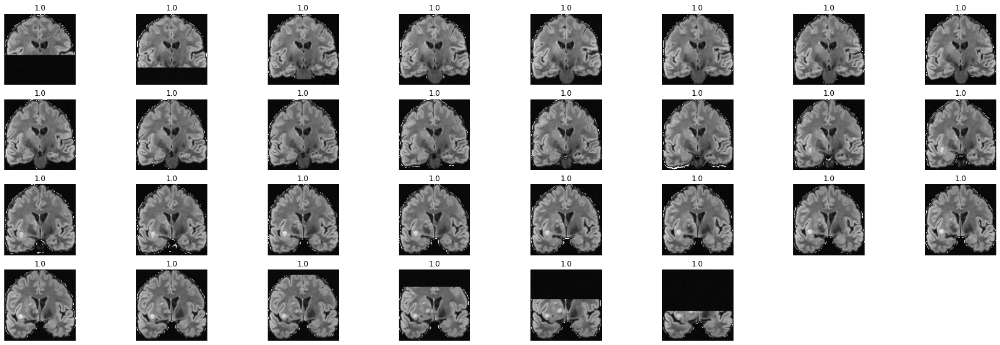

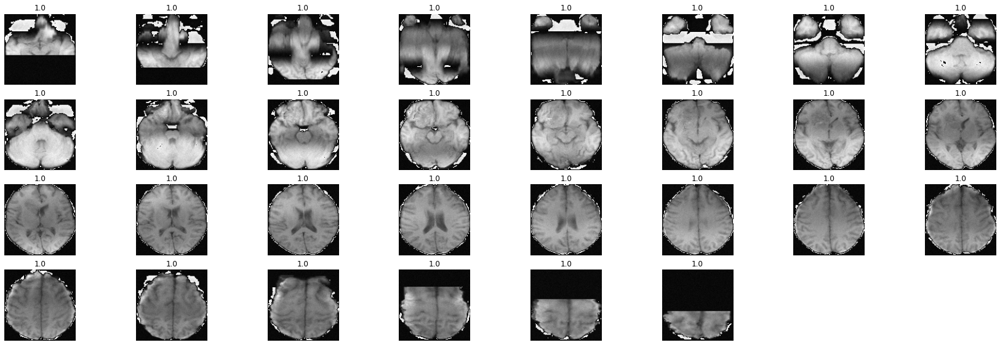

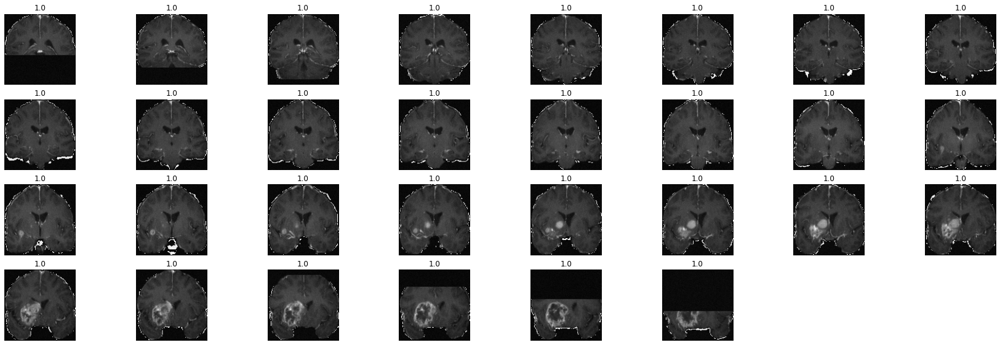

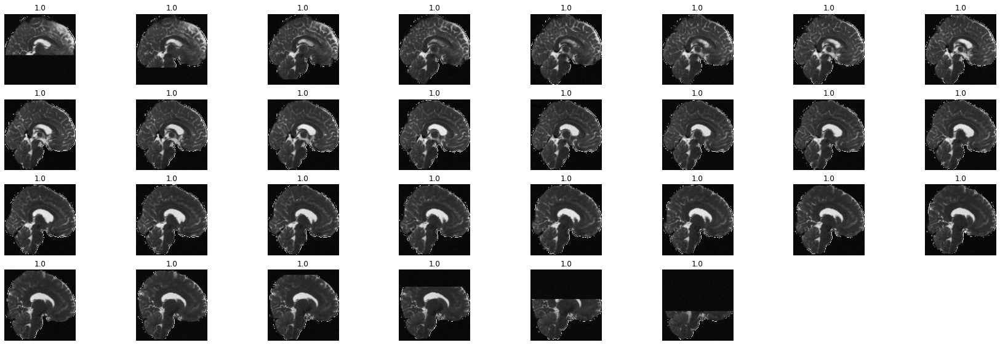

In [33]:
x, y = next(iter(train_generator))
print(x.shape, y.shape, x.numpy().max(), y.numpy().min())  

if modeling_in == '3D':
    for j in range(input_channel):
        plt.figure(figsize=(30, 20))
        for i in range(input_depth):
            plt.subplot(8, 8, i + 1)
            plt.imshow(x[0 ,:, :, i, j], cmap='gray')
            plt.axis("off")
            plt.title(y[0].numpy())
        plt.show()
elif modeling_in == '2D':
    plt.figure(figsize=(30, 20))
    for i in range(input_depth*input_channel):
        plt.subplot(5, 8, i + 1)
        plt.imshow(x[5 ,:, :, i], cmap='gray')
        plt.axis("off")
        plt.title(y[j].numpy())

## Visualize Train Set with Keras Augmentation

In [34]:
tf_gen = TFDataGenerator(
    train_data,
    modeling_in = modeling_in, 
    shuffle     = True,     
    aug_lib     = 'keras', 
    batch_size  = batch_size,   
    rescale     = True
)   
                   
if modeling_in == '2D':
    train_generator = tf_gen.get_2D_data()
elif modeling_in == '3D':
    train_generator = tf_gen.get_3D_data()

(1, 120, 120, 30, 4) (1,) 0.7554619 1.0


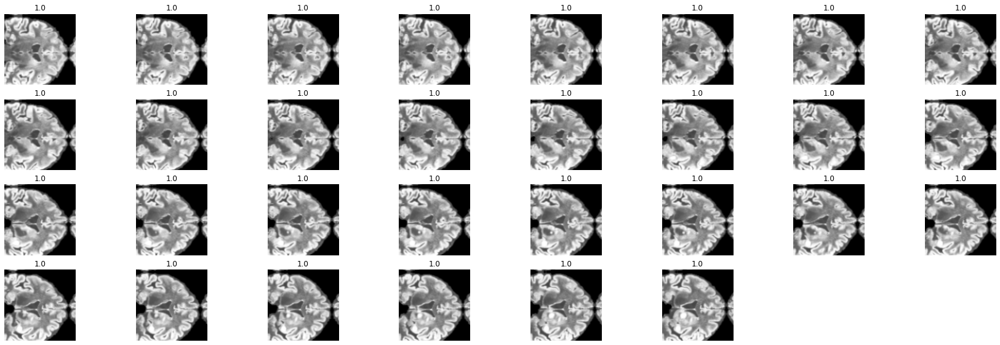

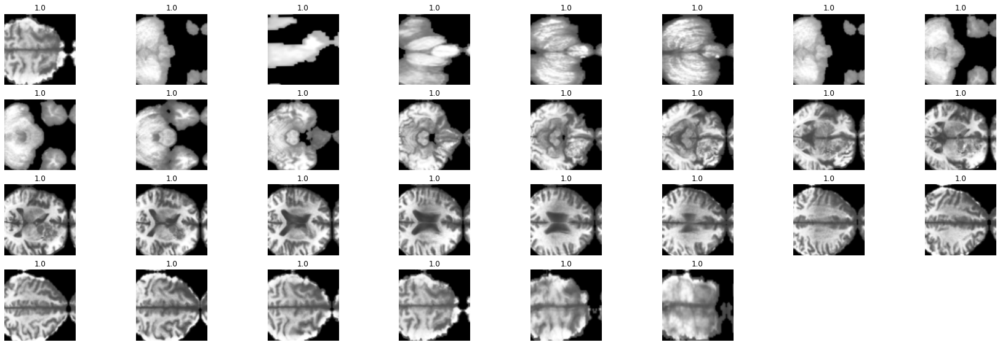

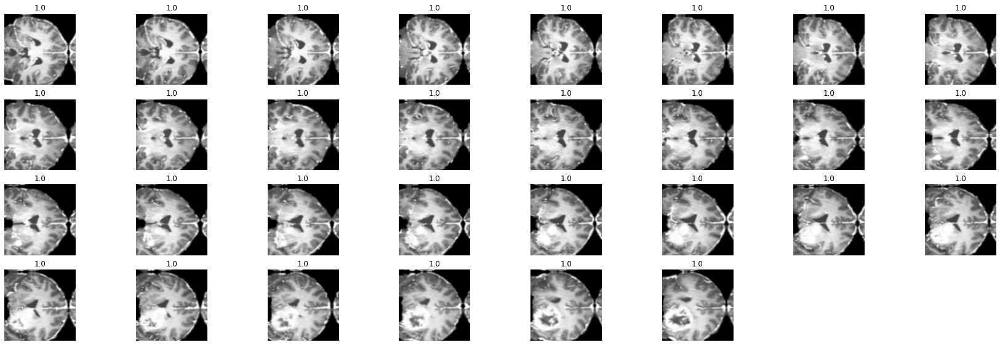

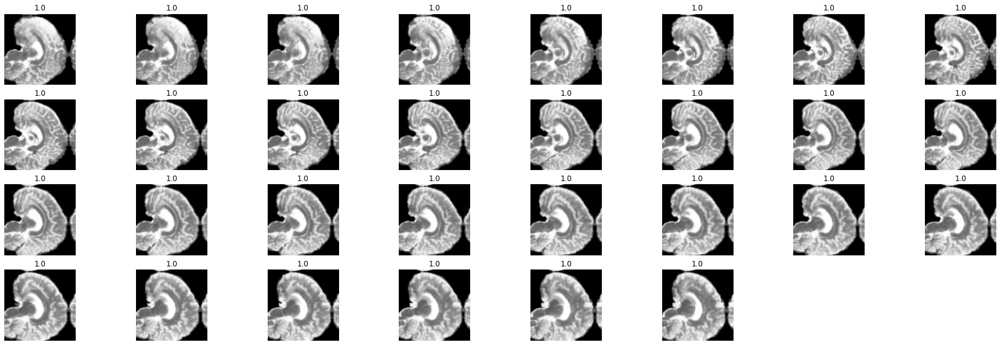

In [35]:
x, y = next(iter(train_generator))
print(x.shape, y.shape, x.numpy().max(), y.numpy().min())  

if modeling_in == '3D':
    for j in range(input_channel):
        plt.figure(figsize=(30, 20))
        for i in range(input_depth):
            plt.subplot(8, 8, i + 1)
            plt.imshow(x[0 ,:, :, i, j], cmap='gray')
            plt.axis("off")
            plt.title(y[0].numpy())
        plt.show()
elif modeling_in == '2D':
    plt.figure(figsize=(30, 20))
    for i in range(input_depth*input_channel):
        plt.subplot(5, 8, i + 1)
        plt.imshow(x[5 ,:, :, i], cmap='gray')
        plt.axis("off")
        plt.title(y[j].numpy())

## Get Validation Set

In [36]:
tf_gen = TFDataGenerator(
    val_data,
    modeling_in = modeling_in,  
    shuffle     = False,     
    aug_lib     = None,    
    batch_size  = batch_size,   
    rescale     = True          
) 

if modeling_in == '2D':
    valid_generator = tf_gen.get_2D_data()
elif modeling_in == '3D':
    valid_generator = tf_gen.get_3D_data()

(1, 120, 120, 30, 4) (1,) 0.9960785 1.0


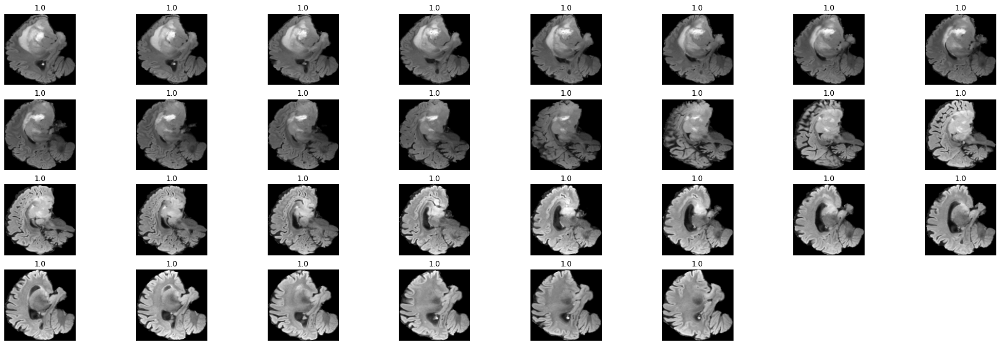

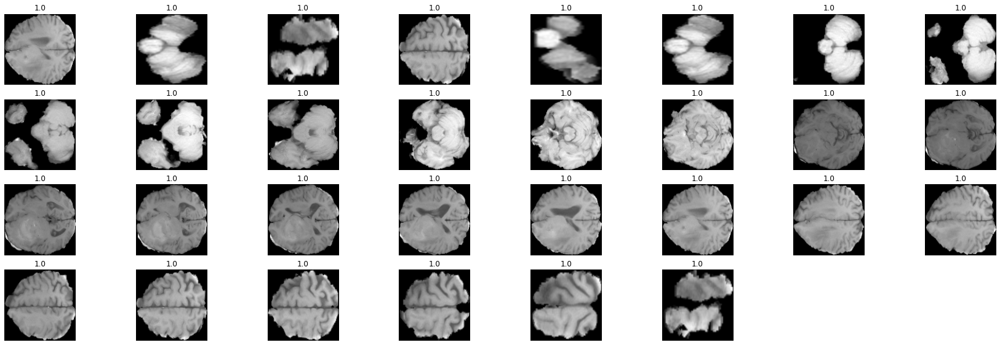

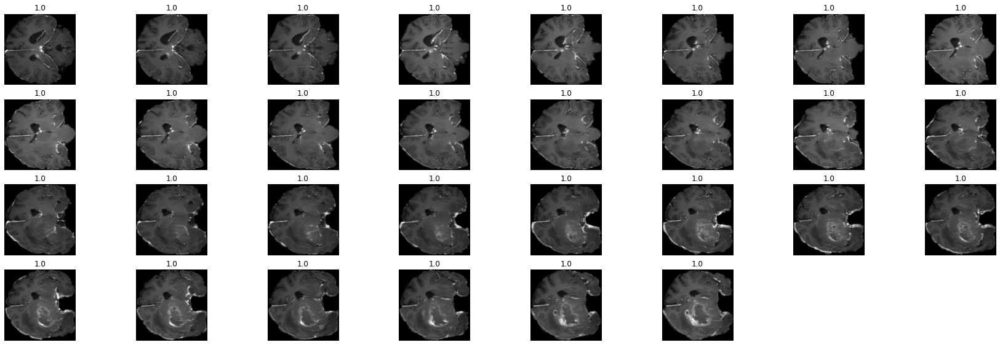

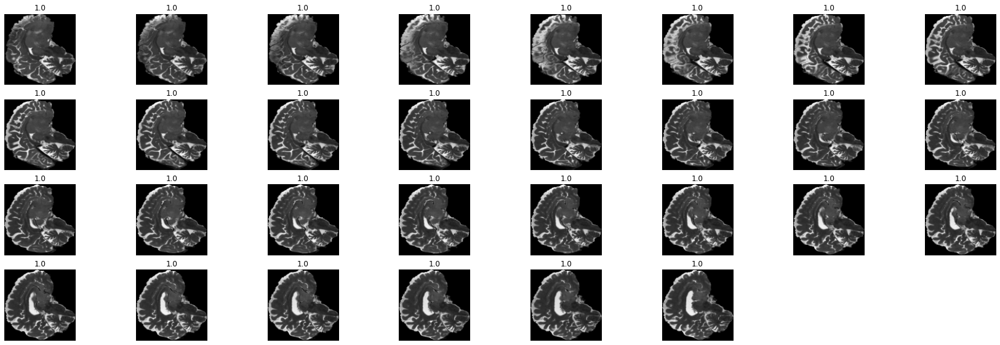

In [37]:
x, y = next(iter(valid_generator))
print(x.shape, y.shape, x.numpy().max(), y.numpy().min()) 

if modeling_in == '3D':
    for j in range(input_channel):
        plt.figure(figsize=(30, 20))
        for i in range(input_depth):
            plt.subplot(8, 8, i + 1)
            plt.imshow(x[0 ,:, :, i, j], cmap='gray')
            plt.axis("off")
            plt.title(y[0].numpy())
        plt.show()
elif modeling_in == '2D':
    plt.figure(figsize=(30, 20))
    for i in range(input_depth*input_channel):
        plt.subplot(5, 8, i + 1)
        plt.imshow(x[0 ,:, :, i], cmap='gray')
        plt.axis("off")
        plt.title(y[0].numpy())

## 3D Model : Pre-trained Weights

TF.Keras Model Subclassing: BrainTumorModel3D
In 3D model training, we need to use lower batch size for expensive computation cost which is somewhat not wanted. So, we will be trying to use Gradient Accumulation (GA) technique to over come this issue. In TF.Keras, we can customize the popular .fit method easily to implement such various techniques and able to control every training details.

In [38]:
class BrainTumorModel3D(keras.Model):
    def __init__(self, 
                 model,           # Sequential or Functional or Subclass Model 
                 n_gradients=1,   # e.g total_batch_size = batch_size * n_gradients
                 *args, **kwargs):
        super(BrainTumorModel3D, self).__init__(*args, **kwargs)
        self.model = model
        self.n_gradients = tf.constant(n_gradients, dtype=tf.int32)
        self.n_acum_step = tf.Variable(0, dtype=tf.int32, trainable=False)
        self.gradient_accumulation = [tf.Variable(tf.zeros_like(v, dtype=tf.float32), 
                                                  trainable=False) 
                                      for v in self.model.trainable_variables]

    # The training step, forward and backward propagation 
    def train_step(self, data):
        # Adding 1 to num_acum_step till n_gradients and start GA
        self.n_acum_step.assign_add(1)
        # Unpack the data 
        images, labels = data

        # Open a GradientTape to record the operations run
        # during the forward pass, which enables auto-differentiation.
        with tf.GradientTape() as tape:
            # Run the forward pass of the layer or model .
            # The operations that the layer applies
            # to its inputs are going to be recorded
            # on the GradientTape.
            predictions = self.model(images, training=True)
            # Compute the loss value for this minibatch.
            loss = self.compiled_loss(labels, predictions)
        
        # Compute batch gradients
        gradients = tape.gradient(loss, self.model.trainable_variables)
        
        # Accumulating the batch gradients
        for i in range(len(self.gradient_accumulation)):
            self.gradient_accumulation[i].assign_add(gradients[i])
 
        # If n_acum_step reach the n_gradients then we apply accumulated gradients -
        # - to update the variables otherwise do nothing
        tf.cond(tf.equal(self.n_acum_step, self.n_gradients),
                self.apply_accu_gradients, lambda: None)

        # update metrics
        self.compiled_metrics.update_state(labels, predictions)
        return {m.name: m.result() for m in self.metrics}
    
    # Function for applying Gradient Accum. 
    def apply_accu_gradients(self):
        # Apply accumulated gradients
        self.optimizer.apply_gradients(zip(self.gradient_accumulation, 
                                           self.model.trainable_variables))

        # Reset
        self.n_acum_step.assign(0)
        for i in range(len(self.gradient_accumulation)):
            self.gradient_accumulation[i].assign(
                tf.zeros_like(self.model.trainable_variables[i],  dtype=tf.float32)
            )

    # The test step for evaluation and inference 
    def test_step(self, data):
        # Unpack the data 
        images, labels = data
        
        # Run model on inference mode 
        predictions = self.model(images, training=False)
        
        # Compute the loss value for this minibatch.
        loss = self.compiled_loss(labels, predictions)
        
        # Update metrics
        self.compiled_metrics.update_state(labels,  predictions)
        return {m.name: m.result() for m in self.metrics}
    
    # A call funciton needs to be implemented 
    def call(self, inputs, *args, **kwargs):
        return self.model(inputs)
    
    # A custom l2 regularization loss for model to tackle overfit 
    def reg_l2_loss(self, weight_decay = 1e-5):
        return weight_decay * tf.add_n([
            tf.nn.l2_loss(v)
            for v in self.model.trainable_variables
        ])

We define the 3D model with well-know Functional API and after that we will pass it to the Subclass API model.

In [39]:
import efficientnet_3D.tfkeras as efn 
from classification_models_3D.tfkeras import Classifiers  

# build models 
input_tensor = keras.Input((input_height, input_width, 
                            input_depth, input_channel), name='input3D')
mapping3feat = keras.layers.Conv3D(3, (3,3,3), 
                                   strides=(1, 1, 1), 
                                   padding='same', 
                                   use_bias=True)(input_tensor)

mobilenetv2, _ = Classifiers.get('mobilenetv2')
feat_ext = mobilenetv2(input_shape=(input_height, input_width,input_depth, 3), 
                       include_top=False, weights='imagenet')

output = feat_ext(mapping3feat)
output = keras.layers.GlobalAveragePooling3D()(output)
output = keras.layers.Dense(1, activation='sigmoid')(output)
model  = keras.Model(input_tensor, output)
model.summary()

10018816/10015920 [==============================] - 0s 0us/step
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input3D (InputLayer)         [(None, 120, 120, 30, 4)] 0         
_________________________________________________________________
conv3d (Conv3D)              (None, 120, 120, 30, 3)   327       
_________________________________________________________________
mobilenetv2_1.00_224 (Functi (None, 4, 4, 1, 1280)     2388160   
_________________________________________________________________
global_average_pooling3d (Gl (None, 1280)              0         
_________________________________________________________________
dense (Dense)                (None, 1)                 1281      
Total params: 2,389,768
Trainable params: 2,355,656
Non-trainable params: 34,112
_________________________________________________________________


## Compiling the Model

In [40]:
# Passing Functional Model on Subclass API class. 
# In order to get some leverage, i.e. Gradient Accumulation. 
keras.backend.clear_session()
model3D = BrainTumorModel3D(model, n_gradients = batch_size*accum_step)

# compiling 
model3D.compile(
    loss=tfa.losses.SigmoidFocalCrossEntropy(reduction=tf.keras.losses.Reduction.SUM),
    optimizer=keras.optimizers.Ftrl(),
    metrics=[keras.metrics.AUC(), keras.metrics.BinaryAccuracy(name='acc')],
)

## Custom Callback

In [41]:
# Define callbacks.
class CustomModelCheckpoint(keras.callbacks.Callback):
    def on_train_begin(self, logs=None):
        self.val_loss = []
        self.val_auc  = []
        self.val_acc  = []
    def on_epoch_end(self, epoch, logs=None):
        current_val_loss = logs.get("val_loss")
        current_val_auc  = logs.get('val_auc')
        current_val_acc  = logs.get('val_acc')
        self.val_loss.append(current_val_loss)
        self.val_auc.append(current_val_auc)
        self.val_acc.append(current_val_acc)
        
        # save based on lowest validation loss 
        if current_val_loss <= min(self.val_loss):
            print('Find lowest val_loss. Saving model weight.')
            self.model.save_weights('model_at_val_loss.h5') 
            
        # save based on highest validation auc 
        if current_val_auc >= max(self.val_auc):
            print('Find highest val_auc. Saving model weight.')
            self.model.save_weights('model_at_val_auc.h5') 
        
        # save based on highest validation acc
        if current_val_acc >= max(self.val_acc):
            print('Find highest val_acc. Saving model weight.')
            self.model.save_weights('model_at_val_acc.h5') 

# A custom lr sched 
def get_lr_callback(batch_size=8):
    lr_start   = 0.000005
    lr_max     = 0.00000125 * batch_size
    lr_min     = 0.000001
    lr_ramp_ep = 5
    lr_sus_ep  = 0
    lr_decay   = 0.8
   
    def lrfn(epoch):
        if epoch < lr_ramp_ep:
            lr = (lr_max - lr_start) / lr_ramp_ep * epoch + lr_start
            
        elif epoch < lr_ramp_ep + lr_sus_ep:
            lr = lr_max
    
        else:
            lr = (lr_max - lr_min) * lr_decay**(epoch - lr_ramp_ep - lr_sus_ep) + lr_min
            
        return lr

    return keras.callbacks.LearningRateScheduler(lrfn, verbose=True)

In [42]:
# epoch params
epochs = 5

# Running 100 training and 50 validation steps,
# remove `.take` when training on the full dataset
model3D.fit(
    train_generator.take(100),
    epochs=epochs,
    validation_data=valid_generator.take(50),
    callbacks=[CustomModelCheckpoint(), 
               tf.keras.callbacks.CSVLogger('history.csv'),
               get_lr_callback(batch_size)], 
    verbose=1
)

Epoch 1/5

Epoch 00001: LearningRateScheduler reducing learning rate to 5e-06.
100/100 [==============================] - 1316s 8s/step - loss: 0.0813 - auc: 0.5099 - acc: 0.4611 - val_loss: 0.0884 - val_auc: 0.5000 - val_acc: 0.5200
Find lowest val_loss. Saving model weight.
Find highest val_auc. Saving model weight.
Find highest val_acc. Saving model weight.
Epoch 2/5

Epoch 00002: LearningRateScheduler reducing learning rate to 4.25e-06.
100/100 [==============================] - 691s 7s/step - loss: 0.0797 - auc: 0.4950 - acc: 0.4199 - val_loss: 0.0884 - val_auc: 0.5000 - val_acc: 0.5200
Find lowest val_loss. Saving model weight.
Find highest val_auc. Saving model weight.
Find highest val_acc. Saving model weight.
Epoch 3/5

Epoch 00003: LearningRateScheduler reducing learning rate to 3.5000000000000004e-06.
100/100 [==============================] - 692s 7s/step - loss: 0.0797 - auc: 0.4950 - acc: 0.4199 - val_loss: 0.0884 - val_auc: 0.5000 - val_acc: 0.5200
Find lowest val_loss. 

## InceptionResNet-3D

In [43]:
import tensorflow as tf 
from tensorflow.keras.layers import * 
from tensorflow.keras.models import Model
from tensorflow.keras.utils import plot_model

class Conv3DBatchNorm(tf.keras.layers.Layer):
    def __init__(self, nb_filters, kernel_size, padding, strides):
        super(Conv3DBatchNorm, self).__init__()
        
        # parameters 
        self.nb_filters = nb_filters
        self.kernel_size = kernel_size 
        self.padding = padding 
        self.strides = strides 

        # layers
        self.conv = tf.keras.layers.Conv3D(self.nb_filters, self.kernel_size, 
                                           self.strides, self.padding)
        self.bn   = tf.keras.layers.BatchNormalization()
        
    def call(self, input_tensor, training=False):
        x = self.conv(input_tensor)
        x = self.bn(x, training=training)
        return tf.nn.relu(x)
    
    def get_config(self):
        return {
            'nb_filters': self.nb_filters,
            'kernel_size': self.kernel_size,
            'padding': self.padding,
            'strides': self.strides
        } 

In [44]:
class Inception3DModule(tf.keras.layers.Layer):
    def __init__(self, nb_filters, kernel_size1x1, kernel_size3x3):
        super(Inception3DModule, self).__init__()
        
        # params 
        self.nb_filters = nb_filters
        self.kernel_size1x1 = kernel_size1x1
        self.kernel_size3x3 = kernel_size3x3

        # layers 
        self.conv1 = Conv3DBatchNorm(self.nb_filters, 
                                     kernel_size=self.kernel_size1x1,
                                     strides=1, padding='same')
        self.conv2 = Conv3DBatchNorm(self.nb_filters, 
                                     kernel_size=self.kernel_size3x3, 
                                     strides=1, padding='same')
        self.cat   = tf.keras.layers.Concatenate()

    def call(self, input_tensor, training=False):
        x_1x1 = self.conv1(input_tensor)
        x_3x3 = self.conv2(input_tensor)
        x = self.cat([x_1x1, x_3x3])
        return tf.nn.relu(x) 

    def get_config(self):
        return {
            'nb_filters': self.nb_filters,
            'kernel_size1x1': self.kernel_size1x1,
            'kernel_size3x3': self.kernel_size3x3
        }

In [45]:
class Identity3DBlock(tf.keras.layers.Layer):
    def __init__(self, nb_filters, kernel_size, padding, strides, shortcut = False):
        super(Identity3DBlock, self).__init__()
        
        # params 
        self.shortcut = shortcut 
        self.nb_filters = nb_filters 
        self.kernel_size = kernel_size 
        self.padding = padding 
        self.strides = strides 
        
        # layers 
        self.conv1 = Conv3DBatchNorm(self.nb_filters, self.kernel_size, 
                                     self.padding, self.strides)
        self.conv2 = Conv3DBatchNorm(self.nb_filters, self.kernel_size, 
                                     self.padding, self.strides)
        self.conv3 = Conv3DBatchNorm(self.nb_filters, self.kernel_size, 
                                     self.padding, self.strides)
        self.inception = Inception3DModule(self.nb_filters, 
                                           kernel_size1x1 = (1,1,1),
                                           kernel_size3x3 = (3,3,3))
    
    def call(self, input_tensor, training=False):
        x = self.conv1(input_tensor)
        x = self.conv2(x)
        if self.shortcut:
            srtct = self.inception(input_tensor)
            srtct = self.conv3(srtct)
            x = Dropout(0.3)(x)
            x = Add()([x, srtct])
            return tf.nn.relu(x)
        else:
            x = Add()([x, input_tensor])
            return tf.nn.relu(x)
        
    def get_config(self):
        return {
            'shortcut': self.shortcut,
            'nb_filters': self.nb_filters,
            'kernel_size': self.kernel_size,
            'padding': self.padding,
            'strides': self.strides,
        }

In [46]:
def InceptionResNet3D(width=128, height=128, depth=32, num_cls=1):
    inpt = Input((width, height, depth, 1), name='input3D')
    x = ZeroPadding3D((1, 1, 1))(inpt)

    # conv3d + relu + maxplo3d 
    x = Conv3DBatchNorm(nb_filters=16, kernel_size=(3, 3, 3), 
                        strides=1, padding='valid')(x)
    x = MaxPooling3D(pool_size=(2, 2, 2), strides=1)(x)

    # inception_resnet_block_ab
    x = Identity3DBlock(nb_filters=32, kernel_size=(3, 3, 3), 
                        padding='same', strides=1, shortcut=True)(x)
    x = Identity3DBlock(nb_filters=32, kernel_size=(3, 3, 3), 
                        padding='same', strides=1)(x)

    x = AveragePooling3D(pool_size=(2, 2, 2))(x)
    x = GlobalAveragePooling3D()(tf.nn.relu(x))
    x = Dense(num_cls, activation='sigmoid')(x)

    model = Model(inputs=inpt, outputs=x)
    return model

In [47]:
tf.keras.backend.clear_session()
model = InceptionResNet3D(width=input_width, height=input_height, 
                          depth=input_depth, num_cls=1)
print(model.summary())

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input3D (InputLayer)         [(None, 120, 120, 30, 1)] 0         
_________________________________________________________________
zero_padding3d (ZeroPadding3 (None, 122, 122, 32, 1)   0         
_________________________________________________________________
conv3d_batch_norm (Conv3DBat (None, 120, 120, 30, 16)  512       
_________________________________________________________________
max_pooling3d (MaxPooling3D) (None, 119, 119, 29, 16)  0         
_________________________________________________________________
identity3d_block (Identity3D (None, 119, 119, 29, 32)  111904    
_________________________________________________________________
identity3d_block_1 (Identity (None, 119, 119, 29, 32)  55616     
_________________________________________________________________
average_pooling3d (AveragePo (None, 59, 59, 14, 32)    0     

In [48]:
import os
import torch
import torch.nn as nn
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import pydicom as dicom
import cv2
import ast

import warnings
warnings.filterwarnings("ignore")

In [49]:
path = '/kaggle/input/rsna-miccai-brain-tumor-radiogenomic-classification/'
os.listdir(path)

['sample_submission.csv', 'train_labels.csv', 'test', 'train']

In [50]:
train_data = pd.read_csv(path+'train_labels.csv')
samp_subm = pd.read_csv(path+'sample_submission.csv')

In [51]:
print('Samples train:', len(train_data))
print('Samples test:', len(samp_subm))

Samples train: 585
Samples test: 87


In [52]:
train_data.head()

,BraTS21ID,MGMT_value
0,0,1
1,2,1
2,3,0
3,5,1
4,6,1


,BraTS21ID,MGMT_value
0,1,0.5
1,13,0.5
2,15,0.5
3,27,0.5
4,37,0.5


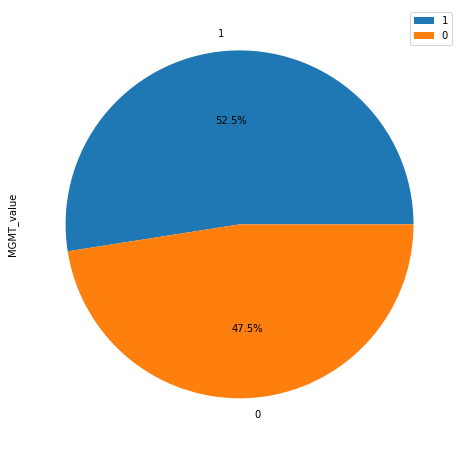

In [53]:
train_data["MGMT_value"].value_counts().head(2).plot(kind = 'pie', autopct='%1.1f%%', figsize=(8, 8)).legend()
train_data["MGMT_value"].value_counts()
samp_subm.head()

In [54]:
folder = str(train_data.loc[0, 'BraTS21ID']).zfill(5)
folder

'00000'

In [55]:
os.listdir(path+'train/'+folder)

['T2w', 'T1wCE', 'T1w', 'FLAIR']

In [56]:
path_file = ''.join([path, 'train/', folder, '/', 'FLAIR/'])
image = os.listdir(path_file)[0]
data_file = dicom.dcmread(path_file+image)
img = data_file.pixel_array

In [57]:
print('Image shape:', img.shape)

Image shape: (512, 512)


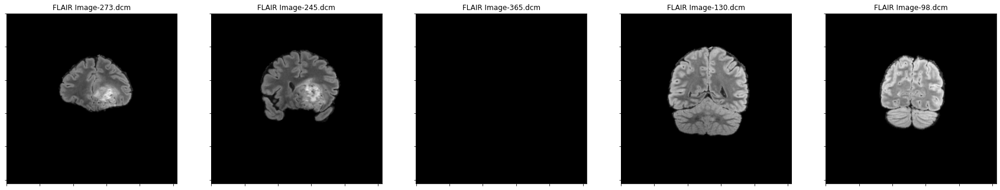

In [58]:
def plot_examples(row = 0, cat = 'FLAIR'): 
    folder = str(train_data.loc[row, 'BraTS21ID']).zfill(5)
    path_file = ''.join([path, 'train/', folder, '/', cat, '/'])
    images = os.listdir(path_file)
    
    fig, axs = plt.subplots(1, 5, figsize=(30, 30))
    fig.subplots_adjust(hspace = .2, wspace=.2)
    axs = axs.ravel()
    
    for num in range(5):
        data_file = dicom.dcmread(path_file+images[num])
        img = data_file.pixel_array
        axs[num].imshow(img, cmap='gray')
        axs[num].set_title(cat+' '+images[num])
        axs[num].set_xticklabels([])
        axs[num].set_yticklabels([])
        
row = 0
plot_examples(row = row, cat = 'FLAIR')

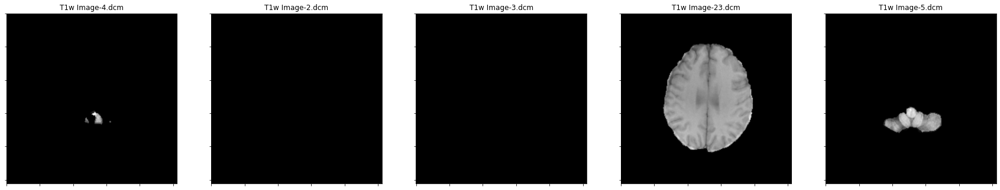

In [59]:
plot_examples(row = row, cat = 'T1w')

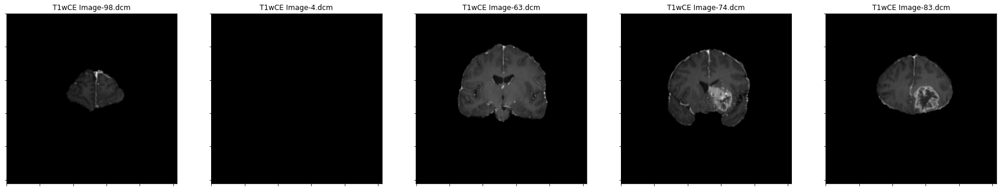

In [60]:
plot_examples(row = row, cat = 'T1wCE')

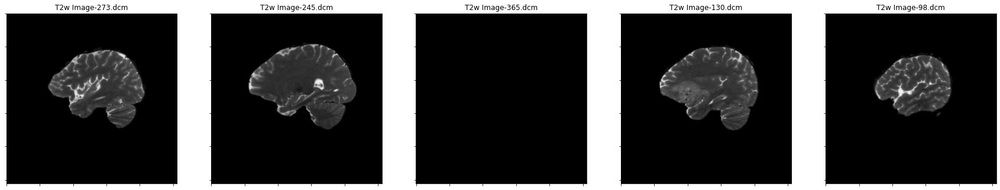

In [61]:
plot_examples(row = row, cat = 'T2w')

In [62]:
VGG_types = {
    'VGG11' : [64, 'M', 128, 'M', 256, 256, 'M', 512,512, 'M',512,512,'M'],
    'VGG13' : [64,64, 'M', 128, 128, 'M', 256, 256, 'M', 512,512, 'M', 512,512,'M'],
    'VGG16' : [64,64, 'M', 128, 128, 'M', 256, 256,256, 'M', 512,512,512, 'M',512,512,512,'M'],
    'VGG19' : [64,64, 'M', 128, 128, 'M', 256, 256,256,256, 'M', 512,512,512,512, 'M',512,512,512,512,'M']
}
class VGGnet(nn.Module):
    def __init__(self, model, in_channels=3, num_classes=10, init_weights=True):
        super(VGGnet,self).__init__()
        self.in_channels = in_channels

        # create conv_layers corresponding to VGG type
        self.conv_layers = self.create_conv_laters(VGG_types[model])

        self.fcs = nn.Sequential(
            nn.Linear(1536, 1536//2),
            nn.ReLU(),
            nn.Dropout(),
            nn.Linear(1536//2, 1536//2),
            nn.ReLU(),
            nn.Dropout(),
            nn.Linear(1536//2, num_classes),
        )

        # weight initialization
        if init_weights:
            self._initialize_weights()

    def forward(self, x):
        x = self.conv_layers(x)
        x = x.view(x.size(0), -1)
        x = self.fcs(x)
        return x

    # defint weight initialization function
    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv3d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.BatchNorm3d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.Linear):
                nn.init.normal_(m.weight, 0, 0.01)
                nn.init.constant_(m.bias, 0)
    
    # define a function to create conv layer taken the key of VGG_type dict 
    def create_conv_laters(self, architecture):
        layers = []
        in_channels = self.in_channels # 3

        for x in architecture:
            if type(x) == int: # int means conv layer
                out_channels = x

                layers += [nn.Conv3d(in_channels=in_channels, out_channels=out_channels,
                                     kernel_size=(3,2,3), stride=(1,1,1), padding=(1,1,1)),
                           nn.BatchNorm3d(x),
                           nn.ReLU()]
                in_channels = x
            elif x == 'M':
                layers += [nn.MaxPool3d(kernel_size=(2,2,2), stride=(2,2,2))]
        
        return nn.Sequential(*layers)

In [63]:
# define device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# creat VGGnet object
# Choose between 'VGG11', 'VGG13', 'VGG16', 'VGG19'
model = VGGnet('VGG16', in_channels=1, num_classes=1, init_weights=True).to(device)
print(model)

VGGnet(
  (conv_layers): Sequential(
    (0): Conv3d(1, 64, kernel_size=(3, 2, 3), stride=(1, 1, 1), padding=(1, 1, 1))
    (1): BatchNorm3d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Conv3d(64, 64, kernel_size=(3, 2, 3), stride=(1, 1, 1), padding=(1, 1, 1))
    (4): BatchNorm3d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
    (6): MaxPool3d(kernel_size=(2, 2, 2), stride=(2, 2, 2), padding=0, dilation=1, ceil_mode=False)
    (7): Conv3d(64, 128, kernel_size=(3, 2, 3), stride=(1, 1, 1), padding=(1, 1, 1))
    (8): BatchNorm3d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): ReLU()
    (10): Conv3d(128, 128, kernel_size=(3, 2, 3), stride=(1, 1, 1), padding=(1, 1, 1))
    (11): BatchNorm3d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (12): ReLU()
    (13): MaxPool3d(kernel_size=(2, 2, 2), stride=(2, 2, 2), padding=0, dilation=1, ceil_mode=False)

In [64]:
samp_subm.head()

,BraTS21ID,MGMT_value
0,1,0.5
1,13,0.5
2,15,0.5
3,27,0.5
4,37,0.5


## Plotting 3D MRI scans

To plot them, we need to rasterize images into a point cloud with reduced dimensionality.
Passing each scanned pixel into our visualization would net us more than a million points,
so we need to
1) resize every image to 128x128 
2) downsample space without tumor for brevity.

In [65]:
import tarfile
import plotly
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
def extract_task1_files(root="./data"):
    tar = tarfile.open("/kaggle/input/brats-2021-task1/BraTS2021_Training_Data.tar")
    tar.extractall(root)
    tar.close()

In [66]:
extract_task1_files()
import nibabel as nib
import os
import albumentations as A
import numpy as np


class ImageReader:
    def __init__(self, root:str, img_size:int=256, normalize:bool=False, single_class:bool=False):
        pad_size = 256 if img_size > 256 else 224
        self.resize = A.Compose(
            [
                A.PadIfNeeded(min_height=pad_size, min_width=pad_size, value=0),
                A.Resize(img_size, img_size)
            ]
        )
        self.normalize=normalize
        self.single_class=single_class
        self.root=root
        
    def read_file(self, path:str) -> dict:
        scan_type = path.split('_')[-1]
        raw_image = nib.load(path).get_fdata()
        raw_mask = nib.load(path.replace(scan_type, 'seg.nii.gz')).get_fdata()
        processed_frames, processed_masks = [], []
        for frame_idx in range(raw_image.shape[2]):
            frame = raw_image[:, :, frame_idx]
            mask = raw_mask[:, :, frame_idx]
            if self.normalize:
                if frame.max() > 0:
                    frame = frame/frame.max()
                frame = frame.astype(np.float32)
            else:
                frame = frame.astype(np.uint8)
            resized = self.resize(image=frame, mask=mask)
            processed_frames.append(resized['image'])
            processed_masks.append(1*(resized['mask'] > 0) if self.single_class else resized['mask'])
        return {
            'scan': np.stack(processed_frames, 0),
            'segmentation': np.stack(processed_masks, 0),
            'orig_shape': raw_image.shape
        }
    
    def load_patient_scan(self, idx:int, scan_type:str='flair') -> dict:
        patient_id = str(idx).zfill(5)
        scan_filename = f'{self.root}/BraTS2021_{patient_id}/BraTS2021_{patient_id}_{scan_type}.nii.gz'
        return self.read_file(scan_filename)

In [67]:
import plotly.graph_objects as go
import numpy as np


def generate_3d_scatter(
    x:np.array, y:np.array, z:np.array, colors:np.array,
    size:int=3, opacity:float=0.2, scale:str='Teal',
    hover:str='skip', name:str='MRI'
) -> go.Scatter3d:
    return go.Scatter3d(
        x=x, y=y, z=z,
        mode='markers', hoverinfo=hover,
        marker = dict(
            size=size, opacity=opacity,
            color=colors, colorscale=scale
        ),
        name=name
    )


class ImageViewer3d():
    def __init__(
        self, reader:ImageReader, mri_downsample:int=10, mri_colorscale:str='Ice'
    ) -> None:
        self.reader = reader
        self.mri_downsample = mri_downsample
        self.mri_colorscale = mri_colorscale

    def load_clean_mri(self, image:np.array, orig_dim:int) -> dict:
        shape_offset = image.shape[1]/orig_dim
        z, x, y = (image > 0).nonzero()
        # only (1/mri_downsample) is sampled for the resulting image
        x, y, z = x[::self.mri_downsample], y[::self.mri_downsample], z[::self.mri_downsample]
        colors = image[z, x, y]
        return dict(x=x/shape_offset, y=y/shape_offset, z=z, colors=colors)
    
    def load_tumor_segmentation(self, image:np.array, orig_dim:int) -> dict:
        tumors = {}
        shape_offset = image.shape[1]/orig_dim
        # 1/1, 1/3 and 1/5 pixels for tumor tissue classes 1(core), 2(invaded) and 4(enhancing)
        sampling = {
            1: 1, 2: 3, 4: 5
        }
        for class_idx in sampling:
            z, x, y = (image == class_idx).nonzero()
            x, y, z = x[::sampling[class_idx]], y[::sampling[class_idx]], z[::sampling[class_idx]]
            tumors[class_idx] = dict(
                x=x/shape_offset, y=y/shape_offset, z=z,
                colors=class_idx/4
            )
        return tumors
    
    def collect_patient_data(self, scan:dict) -> tuple:
        clean_mri = self.load_clean_mri(scan['scan'], scan['orig_shape'][0])
        tumors = self.load_tumor_segmentation(scan['segmentation'], scan['orig_shape'][0])
        markers_created = clean_mri['x'].shape[0] + sum(tumors[class_idx]['x'].shape[0] for class_idx in tumors)
        return [
            generate_3d_scatter(**clean_mri, scale=self.mri_colorscale, opacity=0.3, hover='skip', name='Brain MRI'),
            generate_3d_scatter(**tumors[1], opacity=0.8, hover='all', name='Necrotic tumor core'),
            generate_3d_scatter(**tumors[2], opacity=0.4, hover='all', name='Peritumoral invaded tissue'),
            generate_3d_scatter(**tumors[4], opacity=0.4, hover='all', name='GD-enhancing tumor'),
        ], markers_created
    
    def get_3d_scan(self, patient_idx:int, scan_type:str='flair') -> go.Figure:
        scan = self.reader.load_patient_scan(patient_idx, scan_type)
        data, num_markers = self.collect_patient_data(scan)
        fig = go.Figure(data=data)
        fig.update_layout(
            title=f"[Patient id:{patient_idx}] brain MRI scan ({num_markers} points)",
            legend_title="Pixel class (click to enable/disable)",
            font=dict(
                family="Courier New, monospace",
                size=14,
            ),
            margin=dict(
                l=0,r=0,b=0,t=30
            ),
            legend=dict(itemsizing='constant')
        )
        return fig
reader = ImageReader('./data', img_size=128, normalize=True, single_class=False)
viewer = ImageViewer3d(reader, mri_downsample=25)

In [68]:
fig = viewer.get_3d_scan(0, 't1')
plotly.offline.iplot(fig)

In [69]:
fig = viewer.get_3d_scan(9, 'flair')
plotly.offline.iplot(fig)

## Feature engineering

In [70]:
from skimage.morphology import binary_closing
import plotly.express as px

data = reader.load_patient_scan(0)

image = data['scan'][60]
masked_image = 1 * (image > 0)
filled_image = 1 * binary_closing(image)

px.imshow(
    np.array([image, masked_image, filled_image]),
    facet_col=0, title="Different image masking - none, threshold and binary closing",
)

In [71]:
def get_approx_pixel_count(scan:np.array, close:bool=False, mask:bool=False, mask_idx:int=-1) -> int:
    slice_areas = []
    for slice_idx in range(scan.shape[0]):
        if close:
            mri = 1 * binary_closing(scan[slice_idx, :, :])
        elif mask_idx >= 0:
            mri = 1 * (scan[slice_idx, :, :] == mask_idx)
        elif mask:
            mri = 1 * (scan[slice_idx, :, :] > 0)
        else:
            raise ValueError('Masking mechanism should be specified')
        mri_area = mri.sum()
        slice_areas.append(mri_area)
    return np.sum(slice_areas)

get_approx_pixel_count(data['segmentation'], mask=True) / get_approx_pixel_count(data['scan'], mask=True)

0.0378232673703338

In [72]:
def get_centroid(scan:np.array, mask_idx:int=1) -> list:
    z, x, y = (scan == mask_idx).nonzero()
    x, y, z = np.median(x), np.median(y), np.median(z)
    return [x/scan.shape[1], y/scan.shape[2], z/scan.shape[0]]

get_centroid(data['segmentation'], 4), get_centroid(data['segmentation'], 1)

([0.578125, 0.3671875, 0.44516129032258067],
 [0.5859375, 0.359375, 0.45161290322580644])

In [73]:
import pandas as pd
df = pd.read_csv('/kaggle/input/rsna-miccai-brain-tumor-radiogenomic-classification/train_labels.csv')
targets = dict(zip(df.BraTS21ID, df.MGMT_value))

In [74]:
features = []
for patient_idx in targets:
    try:
        data = reader.load_patient_scan(patient_idx)
        scan_px = get_approx_pixel_count(data['scan'], mask=True)
        tumor_px = get_approx_pixel_count(data['segmentation'], mask=True)
        dimension = np.product(data['scan'].shape)
        patient_features = [patient_idx, targets[patient_idx]]
        patient_features.extend([scan_px/dimension, tumor_px/dimension, tumor_px/scan_px])
        patient_features.extend(get_centroid(data['segmentation'], 4))
        features.append(patient_features)
    except FileNotFoundError:
        continue

In [75]:
df = pd.DataFrame(features, columns=['idx', 'target', 'scan_pct', 'tumor_pct', 'tumor_ratio', 'x', 'y', 'z']).set_index('idx')
df.head()

,target,scan_pct,tumor_pct,tumor_ratio,x,y,z
idx,,,,,,,
0,1,0.169896,0.006426,0.037823,0.578125,0.367188,0.445161
2,1,0.160032,0.021350,0.133414,0.593750,0.390625,0.516129
3,0,0.185514,0.011115,0.059917,0.523438,0.476562,0.664516
5,1,0.148663,0.013974,0.093995,0.625000,0.640625,0.729032
6,1,0.174226,0.015398,0.088381,0.531250,0.281250,0.438710


In [76]:
fig = px.histogram(df, x="tumor_pct", color="target", marginal="box", nbins=100, barmode='relative')
fig.show()